# 1. Library Imports

This notebook uses the following Python libraries:
- **pandas**: For data manipulation and analysis
- **numpy**: For numerical operations
- **matplotlib**: For creating static visualizations
- **seaborn**: For statistical data visualization
- **scipy.stats**: For statistical functions including z-score calculation

In [2]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from scipy.stats import zscore

# 2. Data Loading

This section handles raw data loading from a text file:

1. Opens and reads 'NEW-DATA-1.T15.txt' file
2. File contains sensor data including:
   - Temperature readings
   - CO2 levels
   - Humidity measurements
   - Weather conditions
   - Timestamps

In [3]:
# Read the raw file
with open('./data/NEW-DATA-1.T15.txt', 'r') as file:
    lines = file.readlines()

In [4]:
# Extract clean column names from the header
header = lines[0].strip()
column_names = []
for col in header.split():
    if ':' in col:
        column_names.append(col.split(':', 1)[1])  # Get part after colon


In [5]:
# Process data rows
data_rows = []
for line in lines[1:]:
    if line.strip():  # Skip empty lines
        values = line.strip().split()
        if len(values) == len(column_names):
            data_rows.append(values)

In [6]:
# Create DataFrame
df1 = pd.DataFrame(data_rows, columns=column_names)

print("Dataframe with clean column names:")
df1.head()



Dataframe with clean column names:


,Date,Time,Temperature_Comedor_Sensor,Temperature_Habitacion_Sensor,Weather_Temperature,CO2_Comedor_Sensor,CO2_Habitacion_Sensor,Humedad_Comedor_Sensor,Humedad_Habitacion_Sensor,Lighting_Comedor_Sensor,...,Meteo_Exterior_Sol_Oest,Meteo_Exterior_Sol_Est,Meteo_Exterior_Sol_Sud,Meteo_Exterior_Piranometro,Exterior_Entalpic_1,Exterior_Entalpic_2,Exterior_Entalpic_turbo,Temperature_Exterior_Sensor,Humedad_Exterior_Sensor,Day_Of_Week
0,13/03/2012,11:45,18.1875,17.8275,0,216.56,221.92,39.9125,42.415,81.665,...,9690.24,12604.2,95436.8,758.88,0,0,0,18.115,48.375,2
1,13/03/2012,12:00,18.4633,18.1207,6.8,219.947,220.363,39.9267,42.2453,81.7413,...,11022,10787.2,95436.8,762.069,0,0,0,18.4147,47.808,2
2,13/03/2012,12:15,18.7673,18.4367,17,219.403,218.933,39.772,42.2267,81.424,...,13960.5,9669.63,95398.6,766.251,0,0,0,18.8533,47.432,2
3,13/03/2012,12:30,19.0727,18.7513,18,218.613,217.045,39.776,42.0987,81.5013,...,18511.2,9648.13,95360.3,766.037,0,0,0,19.2907,47.024,2
4,13/03/2012,12:45,19.3721,19.0414,20,217.714,216.08,39.7757,42.0686,81.4657,...,26349,9208.32,95354.9,762.743,0,0,0,19.74,45.4743,2


In [7]:
print(f"\nNumber of columns: {len(df1.columns)}")


Number of columns: 24


In [8]:
print(f"Number of rows: {len(df1)}")

Number of rows: 2764


In [9]:
print(f"Number of unique values: {df1.nunique()}\n")

Number of unique values: Date                               30
Time                               96
Temperature_Comedor_Sensor       2351
Temperature_Habitacion_Sensor    2316
Weather_Temperature               243
CO2_Comedor_Sensor               1661
CO2_Habitacion_Sensor            1669
Humedad_Comedor_Sensor           2404
Humedad_Habitacion_Sensor        2403
Lighting_Comedor_Sensor           785
Lighting_Habitacion_Sensor       1205
Precipitacion                      15
Meteo_Exterior_Crepusculo         491
Meteo_Exterior_Viento            1596
Meteo_Exterior_Sol_Oest          1304
Meteo_Exterior_Sol_Est           1211
Meteo_Exterior_Sol_Sud           1233
Meteo_Exterior_Piranometro       1459
Exterior_Entalpic_1                 1
Exterior_Entalpic_2                 1
Exterior_Entalpic_turbo             1
Temperature_Exterior_Sensor      2507
Humedad_Exterior_Sensor          2581
Day_Of_Week                        14
dtype: int64



In [10]:
df1.dtypes

Date                             object
Time                             object
Temperature_Comedor_Sensor       object
Temperature_Habitacion_Sensor    object
Weather_Temperature              object
CO2_Comedor_Sensor               object
CO2_Habitacion_Sensor            object
Humedad_Comedor_Sensor           object
Humedad_Habitacion_Sensor        object
Lighting_Comedor_Sensor          object
Lighting_Habitacion_Sensor       object
Precipitacion                    object
Meteo_Exterior_Crepusculo        object
Meteo_Exterior_Viento            object
Meteo_Exterior_Sol_Oest          object
Meteo_Exterior_Sol_Est           object
Meteo_Exterior_Sol_Sud           object
Meteo_Exterior_Piranometro       object
Exterior_Entalpic_1              object
Exterior_Entalpic_2              object
Exterior_Entalpic_turbo          object
Temperature_Exterior_Sensor      object
Humedad_Exterior_Sensor          object
Day_Of_Week                      object
dtype: object

# Exploratory Data Analysis (EDA)
In this section, we perform EDA to understand the dataset better. This includes:
- Checking for missing values
- Visualizing distributions of key features
- Identifying correlations between features
- Detecting outliers

Mathematical operations in this section:
- Time conversion: $t_{hour} = t_{datetime}.hour$
- Data type conversion: $x_{numeric} = float(x_{string})$

Key transformations:
- Date → datetime (DD/MM/YYYY format)
- Time → datetime (HH:MM format)
- Text values → float (where applicable)

In [11]:
# Check for missing values
missing_values = df1.isnull().sum()
print("Missing values in each column:")
print(missing_values)

Missing values in each column:
Date                             0
Time                             0
Temperature_Comedor_Sensor       0
Temperature_Habitacion_Sensor    0
Weather_Temperature              0
CO2_Comedor_Sensor               0
CO2_Habitacion_Sensor            0
Humedad_Comedor_Sensor           0
Humedad_Habitacion_Sensor        0
Lighting_Comedor_Sensor          0
Lighting_Habitacion_Sensor       0
Precipitacion                    0
Meteo_Exterior_Crepusculo        0
Meteo_Exterior_Viento            0
Meteo_Exterior_Sol_Oest          0
Meteo_Exterior_Sol_Est           0
Meteo_Exterior_Sol_Sud           0
Meteo_Exterior_Piranometro       0
Exterior_Entalpic_1              0
Exterior_Entalpic_2              0
Exterior_Entalpic_turbo          0
Temperature_Exterior_Sensor      0
Humedad_Exterior_Sensor          0
Day_Of_Week                      0
dtype: int64


In [12]:
print(df1['Day_Of_Week'].head(200))

0      2
1      2
2      2
3      2
4      2
      ..
195    4
196    4
197    4
198    4
199    4
Name: Day_Of_Week, Length: 200, dtype: object


In [13]:
df1['Date'] = pd.to_datetime(df1['Date'], format='%d/%m/%Y')
df1['Time'] = pd.to_datetime(df1['Time'], format='%H:%M')
df1['Hour'] = df1['Time'].dt.hour

In [14]:
# Add Month as a feature
df1['Month'] = df1['Date'].dt.month

In [15]:
print(f"\nNumber of columns: {len(df1.columns)}")


Number of columns: 26


In [16]:
df1.head(10)

,Date,Time,Temperature_Comedor_Sensor,Temperature_Habitacion_Sensor,Weather_Temperature,CO2_Comedor_Sensor,CO2_Habitacion_Sensor,Humedad_Comedor_Sensor,Humedad_Habitacion_Sensor,Lighting_Comedor_Sensor,...,Meteo_Exterior_Sol_Sud,Meteo_Exterior_Piranometro,Exterior_Entalpic_1,Exterior_Entalpic_2,Exterior_Entalpic_turbo,Temperature_Exterior_Sensor,Humedad_Exterior_Sensor,Day_Of_Week,Hour,Month
0,2012-03-13,1900-01-01 11:45:00,18.1875,17.8275,0,216.56,221.92,39.9125,42.415,81.665,...,95436.8,758.88,0,0,0,18.115,48.375,2,11,3
1,2012-03-13,1900-01-01 12:00:00,18.4633,18.1207,6.8,219.947,220.363,39.9267,42.2453,81.7413,...,95436.8,762.069,0,0,0,18.4147,47.808,2,12,3
2,2012-03-13,1900-01-01 12:15:00,18.7673,18.4367,17,219.403,218.933,39.772,42.2267,81.424,...,95398.6,766.251,0,0,0,18.8533,47.432,2,12,3
3,2012-03-13,1900-01-01 12:30:00,19.0727,18.7513,18,218.613,217.045,39.776,42.0987,81.5013,...,95360.3,766.037,0,0,0,19.2907,47.024,2,12,3
4,2012-03-13,1900-01-01 12:45:00,19.3721,19.0414,20,217.714,216.08,39.7757,42.0686,81.4657,...,95354.9,762.743,0,0,0,19.74,45.4743,2,12,3
5,2012-03-13,1900-01-01 13:00:00,19.6407,19.2773,20,218.389,216.011,39.8107,42.0347,81.2427,...,95354.9,752.683,0,0,0,20.166,45.5467,2,13,3
6,2012-03-13,1900-01-01 13:15:00,19.912,19.5367,20,218.155,215.829,39.8613,41.9947,81.36,...,95354.9,740.949,0,0,0,20.566,44.968,2,13,3
7,2012-03-13,1900-01-01 13:30:00,20.164,19.7307,20,216.661,215.296,39.824,41.9947,81.024,...,95174.7,721.109,0,0,0,20.8427,45.1813,2,13,3
8,2012-03-13,1900-01-01 13:45:00,20.412,19.9693,20,217.461,214.549,39.9587,42.1253,81.104,...,91848.7,699.392,0,0,0,21.204,45.416,2,13,3
9,2012-03-13,1900-01-01 14:00:00,20.64,20.1407,20,215.349,213.909,39.94,42.0427,81.1813,...,87217.5,677.675,0,0,0,21.5227,45.0213,2,14,3


In [17]:
df1.tail()

,Date,Time,Temperature_Comedor_Sensor,Temperature_Habitacion_Sensor,Weather_Temperature,CO2_Comedor_Sensor,CO2_Habitacion_Sensor,Humedad_Comedor_Sensor,Humedad_Habitacion_Sensor,Lighting_Comedor_Sensor,...,Meteo_Exterior_Sol_Sud,Meteo_Exterior_Piranometro,Exterior_Entalpic_1,Exterior_Entalpic_2,Exterior_Entalpic_turbo,Temperature_Exterior_Sensor,Humedad_Exterior_Sensor,Day_Of_Week,Hour,Month
2759,2012-04-11,1900-01-01 05:30:00,21.152,20.8187,13,190.539,192.181,41.312,41.688,11.4427,...,0,-3.434,0,0,0,16.618,49.296,3,5,4
2760,2012-04-11,1900-01-01 05:45:00,21.0413,20.7053,12.1333,190.421,193.067,41.3173,41.72,11.6867,...,523.264,3.852,0,0,0,16.4013,50.0373,3,5,4
2761,2012-04-11,1900-01-01 06:00:00,20.9347,20.5827,12,190.432,193.653,41.3333,41.7573,19.5387,...,3347.46,26.83,0,0,0,16.2607,50.0587,3,6,4
2762,2012-04-11,1900-01-01 06:15:00,20.856,20.52,12,191.531,193.387,41.3093,41.8107,20.9853,...,7110.66,66.9493,0,0,0,16.2367,49.84,3,6,4
2763,2012-04-11,1900-01-01 06:30:00,20.7627,20.44,12.1333,191.563,193.664,41.28,41.8373,20.562,...,10270.7,112.267,0,0,0,16.286,50.2987,3,6,4


In [18]:
# Check data types of the columns
print(df1.dtypes)

Date                             datetime64[ns]
Time                             datetime64[ns]
Temperature_Comedor_Sensor               object
Temperature_Habitacion_Sensor            object
Weather_Temperature                      object
CO2_Comedor_Sensor                       object
CO2_Habitacion_Sensor                    object
Humedad_Comedor_Sensor                   object
Humedad_Habitacion_Sensor                object
Lighting_Comedor_Sensor                  object
Lighting_Habitacion_Sensor               object
Precipitacion                            object
Meteo_Exterior_Crepusculo                object
Meteo_Exterior_Viento                    object
Meteo_Exterior_Sol_Oest                  object
Meteo_Exterior_Sol_Est                   object
Meteo_Exterior_Sol_Sud                   object
Meteo_Exterior_Piranometro               object
Exterior_Entalpic_1                      object
Exterior_Entalpic_2                      object
Exterior_Entalpic_turbo                 

In [19]:
# import pandas as pd

# day_name_to_int = {
#     'Monday': 0,
#     'Tuesday': 1,
#     'Wednesday': 2,
#     'Thursday': 3,
#     'Friday': 4,
#     'Saturday': 5,
#     'Sunday': 6
# }

# if df1['Day_Of_Week'].dtype == 'object':
#     df1['Day_Of_Week'] = df1['Day_Of_Week'].astype(str).str.strip().str.title()
#     df1['Day_Of_Week'] = df1['Day_Of_Week'].map(day_name_to_int).astype('Int32')
# elif pd.api.types.is_categorical_dtype(df1['Day_Of_Week']):
#     df1['Day_Of_Week'] = df1['Day_Of_Week'].cat.codes.astype('Int32')
# elif pd.api.types.is_datetime64_any_dtype(df1['Day_Of_Week']):
#     df1['Day_Of_Week'] = df1['Day_Of_Week'].dt.dayofweek.astype('Int32')
# else:
#     df1['Day_Of_Week'] = pd.to_numeric(df1['Day_Of_Week'], errors='coerce').astype('Int32')

# print("Unique values before conversion (for debugging):")
# print(df1['Day_Of_Week'].unique())

# print("\nDay_Of_Week column after conversion to int:")
# print(df1['Day_Of_Week'].head())
# print("Dtype:", df1['Day_Of_Week'].dtype)

# print("\nRows with failed conversion:")
# print(df1[df1['Day_Of_Week'].isna()])


In [20]:
# Convert columns to numeric where applicable
for col in df1.columns:
    if df1[col].dtype == 'object':  # Check if column is of type object
        df1[col] = pd.to_numeric(df1[col], errors='coerce')  # Convert to numeric, coerce errors to NaN

# Drop columns with all NaN values (if conversion failed for all rows in a column)
df1 = df1.dropna(axis=1, how='all')

# Check for missing values
missing_values = df1.isnull().sum()
print("Missing values in each column:")
print(missing_values)



Missing values in each column:
Date                             0
Time                             0
Temperature_Comedor_Sensor       0
Temperature_Habitacion_Sensor    0
Weather_Temperature              0
CO2_Comedor_Sensor               0
CO2_Habitacion_Sensor            0
Humedad_Comedor_Sensor           0
Humedad_Habitacion_Sensor        0
Lighting_Comedor_Sensor          0
Lighting_Habitacion_Sensor       0
Precipitacion                    0
Meteo_Exterior_Crepusculo        0
Meteo_Exterior_Viento            0
Meteo_Exterior_Sol_Oest          0
Meteo_Exterior_Sol_Est           0
Meteo_Exterior_Sol_Sud           0
Meteo_Exterior_Piranometro       0
Exterior_Entalpic_1              0
Exterior_Entalpic_2              0
Exterior_Entalpic_turbo          0
Temperature_Exterior_Sensor      0
Humedad_Exterior_Sensor          0
Day_Of_Week                      0
Hour                             0
Month                            0
dtype: int64


In [21]:
columns_to_drop = [
    'Exterior_Entalpic_1',
    'Exterior_Entalpic_2',
    'Exterior_Entalpic_turbo'
]

# Drop the columns
df1 = df1.drop(columns=columns_to_drop)

print("\nDataFrame after dropping columns:")
print(df1)


DataFrame after dropping columns:
           Date                Time  Temperature_Comedor_Sensor  \
0    2012-03-13 1900-01-01 11:45:00                     18.1875   
1    2012-03-13 1900-01-01 12:00:00                     18.4633   
2    2012-03-13 1900-01-01 12:15:00                     18.7673   
3    2012-03-13 1900-01-01 12:30:00                     19.0727   
4    2012-03-13 1900-01-01 12:45:00                     19.3721   
...         ...                 ...                         ...   
2759 2012-04-11 1900-01-01 05:30:00                     21.1520   
2760 2012-04-11 1900-01-01 05:45:00                     21.0413   
2761 2012-04-11 1900-01-01 06:00:00                     20.9347   
2762 2012-04-11 1900-01-01 06:15:00                     20.8560   
2763 2012-04-11 1900-01-01 06:30:00                     20.7627   

      Temperature_Habitacion_Sensor  Weather_Temperature  CO2_Comedor_Sensor  \
0                           17.8275               0.0000             216.560   


In [22]:
df1.dtypes

Date                             datetime64[ns]
Time                             datetime64[ns]
Temperature_Comedor_Sensor              float64
Temperature_Habitacion_Sensor           float64
Weather_Temperature                     float64
CO2_Comedor_Sensor                      float64
CO2_Habitacion_Sensor                   float64
Humedad_Comedor_Sensor                  float64
Humedad_Habitacion_Sensor               float64
Lighting_Comedor_Sensor                 float64
Lighting_Habitacion_Sensor              float64
Precipitacion                           float64
Meteo_Exterior_Crepusculo               float64
Meteo_Exterior_Viento                   float64
Meteo_Exterior_Sol_Oest                 float64
Meteo_Exterior_Sol_Est                  float64
Meteo_Exterior_Sol_Sud                  float64
Meteo_Exterior_Piranometro              float64
Temperature_Exterior_Sensor             float64
Humedad_Exterior_Sensor                 float64
Day_Of_Week                             

In [23]:
df1.nunique()

Date                               30
Time                               96
Temperature_Comedor_Sensor       2351
Temperature_Habitacion_Sensor    2316
Weather_Temperature               243
CO2_Comedor_Sensor               1661
CO2_Habitacion_Sensor            1669
Humedad_Comedor_Sensor           2404
Humedad_Habitacion_Sensor        2403
Lighting_Comedor_Sensor           785
Lighting_Habitacion_Sensor       1205
Precipitacion                      15
Meteo_Exterior_Crepusculo         491
Meteo_Exterior_Viento            1596
Meteo_Exterior_Sol_Oest          1304
Meteo_Exterior_Sol_Est           1211
Meteo_Exterior_Sol_Sud           1233
Meteo_Exterior_Piranometro       1459
Temperature_Exterior_Sensor      2507
Humedad_Exterior_Sensor          2581
Day_Of_Week                        14
Hour                               24
Month                               2
dtype: int64


This section performs comprehensive exploratory data analysis using various statistical and visualization techniques:

1. **Distribution Analysis**
   - Histograms for understanding data distribution
   - Box plots for identifying outliers
   - Summary statistics

2. **Outlier Detection**
   Mathematical representation:
   - IQR Method: $IQR = Q_3 - Q_1$
   - Outlier boundaries: 
     - Lower bound: $Q_1 - 1.5 × IQR$
     - Upper bound: $Q_3 + 1.5 × IQR$

3. **Data Normalization**
   Z-score standardization: $z = \frac{x - \mu}{\sigma}$
   where:
   - $x$ is the original value
   - $μ$ is the mean
   - $σ$ is the standard deviation

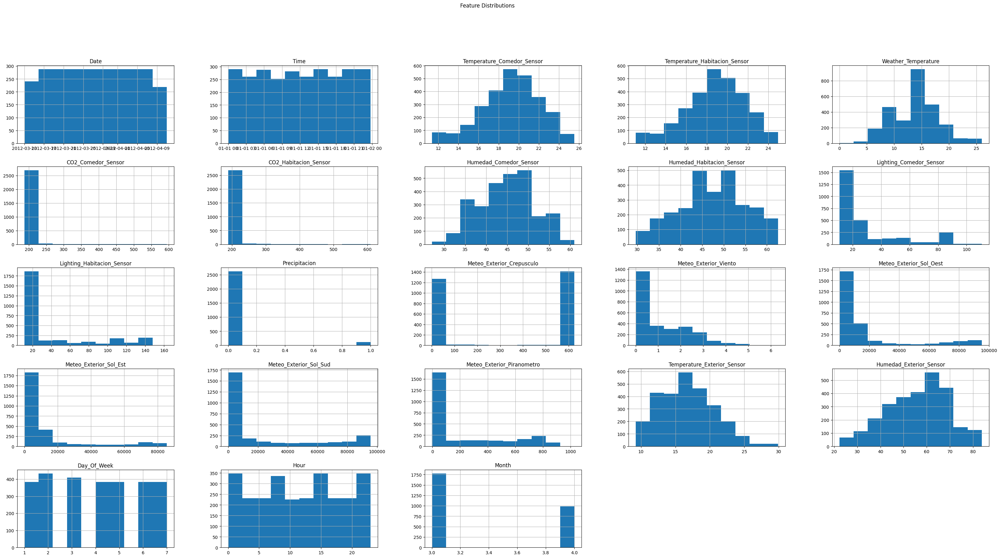

In [24]:
# Visualize distributions of numerical features
if not df1.select_dtypes(include=['number']).empty:
    df1.hist(figsize=(40, 20), )
    plt.suptitle('Feature Distributions')
    plt.show()
else:
    print("No numerical columns available for histogram plotting.")

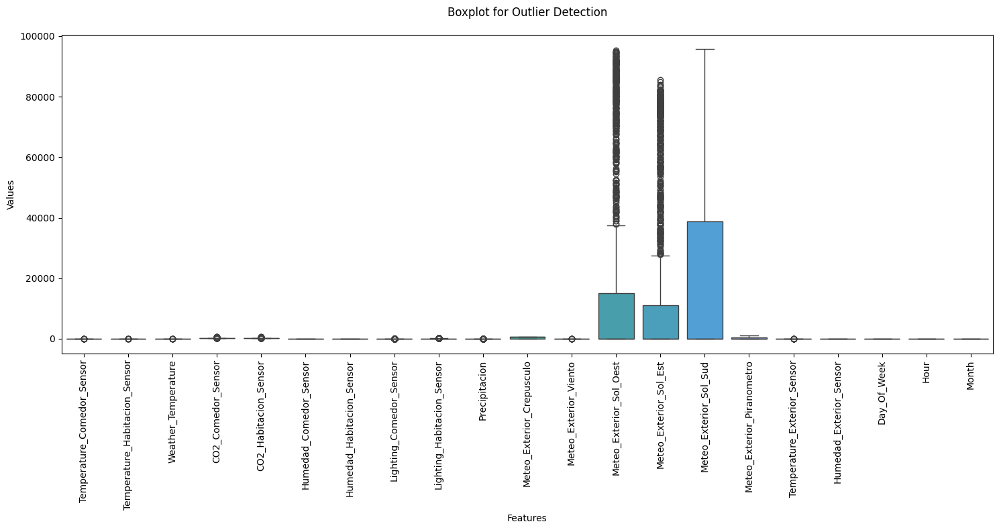

In [25]:

import seaborn as sns
import matplotlib.pyplot as plt
# Create boxplots for outlier detection
plt.figure(figsize=(15, 8))

# Select only numeric columns
numeric_df1 = df1.select_dtypes(include=['float', 'int'])

sns.boxplot(data=numeric_df1)

# Rotate x-axis labels for better readability
plt.xticks(rotation=90)

# Add labels and title
plt.title('Boxplot for Outlier Detection', pad=20)
plt.xlabel('Features')
plt.ylabel('Values')

# Adjust layout to prevent label cutoff
plt.tight_layout()

plt.show()


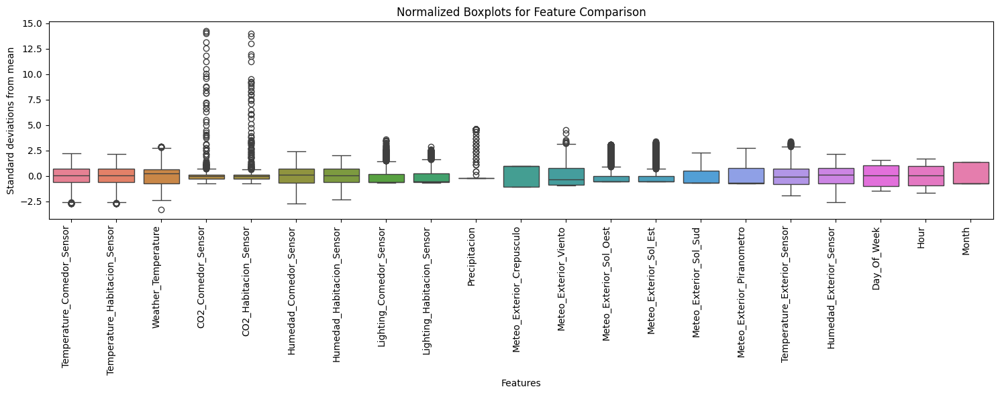

In [26]:
# Create separate boxplots for different scales
plt.figure(figsize=(15, 6))

# Select numeric columns and normalize them for better comparison
numeric_df1 = df1.select_dtypes(include=["float", "int"])
normalized_df1 = (numeric_df1 - numeric_df1.mean()) / numeric_df1.std()

# Create boxplot with normalized data
sns.boxplot(data=normalized_df1)

# Formatting
plt.xticks(rotation=90, ha='right')
plt.title('Normalized Boxplots for Feature Comparison')
plt.xlabel('Features')
plt.ylabel('Standard deviations from mean')

# Adjust layout
plt.tight_layout()
plt.show()

#  Statistical Analysis

This section calculates key statistical measures for our numerical variables:
1. **Count**: Number of non-null observations
2. **Mean**: Average value
3. **Std**: Standard deviation showing data spread
4. **Min/Max**: Range of values
5. **Quartiles**: 25th, 50th (median), and 75th percentiles

These statistics help understand:
- Central tendency
- Data dispersion
- Potential outliers
- Data distribution shape

In [27]:
# Print summary statistics for each variable
print("\nSummary statistics:")
print(numeric_df1.describe())


Summary statistics:
       Temperature_Comedor_Sensor  Temperature_Habitacion_Sensor  \
count                 2764.000000                    2764.000000   
mean                    19.199722                      18.824852   
std                      2.853315                       2.821178   
min                     11.352000                      11.076000   
25%                     17.450800                      17.060350   
50%                     19.373650                      19.021000   
75%                     21.229975                      20.828700   
max                     25.540000                      24.944000   

       Weather_Temperature  CO2_Comedor_Sensor  CO2_Habitacion_Sensor  \
count          2764.000000         2764.000000            2764.000000   
mean             13.897396          208.479123             211.065844   
std               4.171991           27.032686              28.469144   
min               0.000000          187.339000             188.907000   
2

# Feature Relationships Analysis

 This section visualizes relationships between numerical features using pairplots:

 1. **Pairwise Relationships**
    - Scatter plots for feature pairs
    - Distribution plots on diagonal
    - Visual identification of correlations

 2. **Key Insights**
    - Linear/nonlinear relationships
    - Feature distributions
    - Potential outliers

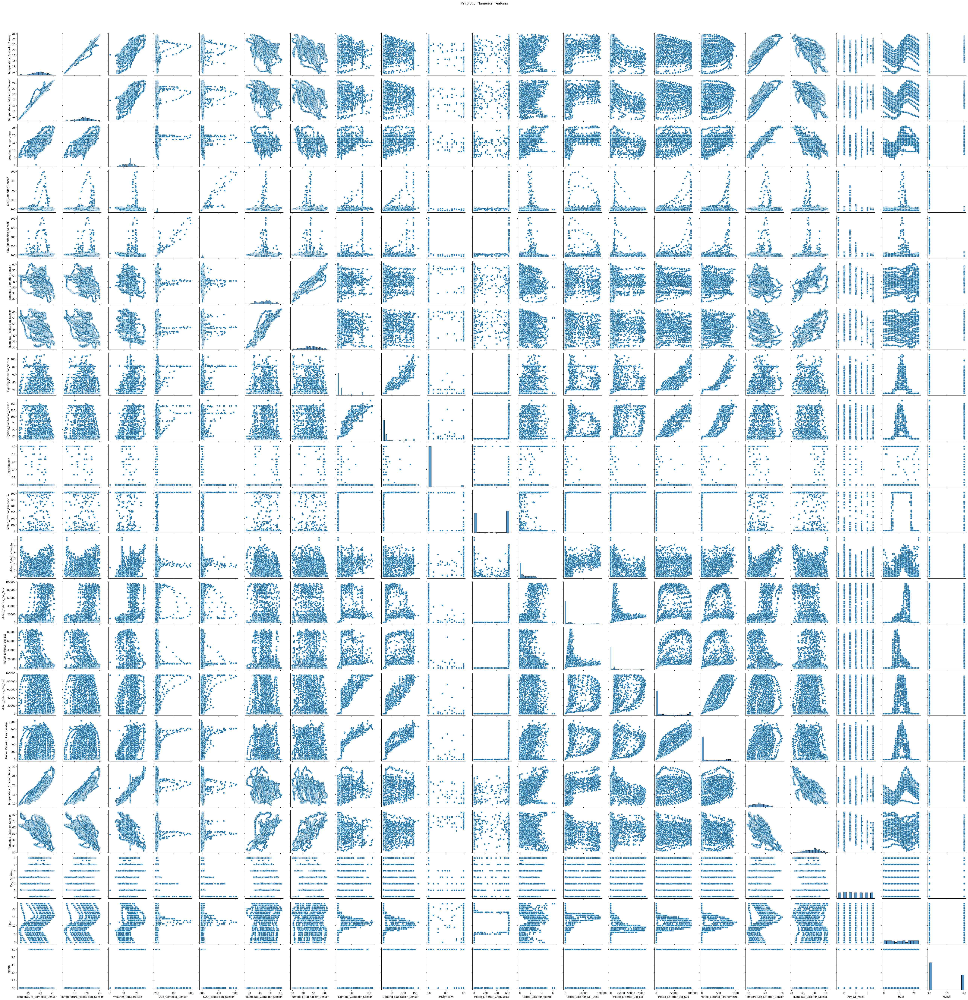

In [28]:
# Pairplot to visualize relationships between features
sns.pairplot(df1.select_dtypes(include=np.number))
plt.suptitle('Pairplot of Numerical Features', y=1.02)
plt.show()

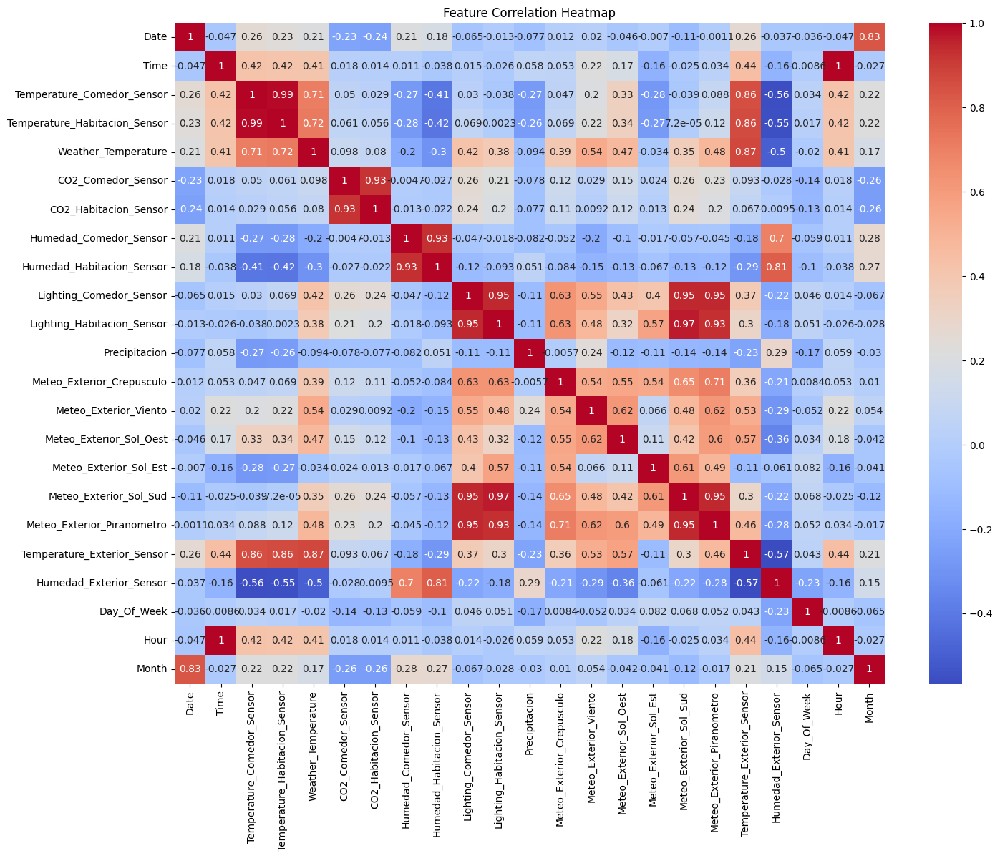

In [29]:
# Correlation heatmap
plt.figure(figsize=(16, 12))
sns.heatmap(df1.corr(), annot=True, cmap='coolwarm')
plt.title('Feature Correlation Heatmap')
plt.show()


In this section, we perform advanced EDA techniques to gain deeper insights into the dataset.

# Time Series Analysis

This section analyzes temporal patterns in the sensor data:

1. **Temperature Trends**
   - Visualizing temperature variations over time
   - Identifying daily and seasonal patterns

2. **ARIMA Modeling**
   Mathematical representation: ARIMA(p,d,q)
   $(1-\phi_1B-...\phi_pB^p)(1-B)^d y_t = (1+\theta_1B+...+\theta_qB^q)\epsilon_t$
   where:
   - $p$ = order of AR term
   - $d$ = degree of differencing
   - $q$ = order of MA term
   - $B$ = backshift operator
   - $\phi$ = AR parameters
   - $\theta$ = MA parameters
   - $\epsilon_t$ = white noise

In [30]:
# # Time Series Analysis
# df1['Temperature_Comedor_Sensor'] = pd.to_numeric(df1['Temperature_Comedor_Sensor'], errors='coerce')
# df1['Temperature_Comedor_Sensor'].plot(figsize=(12, 6))
# plt.title('Temperature Over Time')
# plt.xlabel('Datetime')
# plt.ylabel('Temperature')
# plt.show()

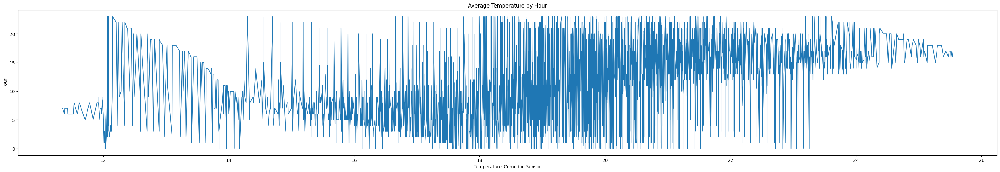

In [31]:
# Hourly patterns
plt.figure(figsize=(40, 6))
sns.lineplot(x='Temperature_Comedor_Sensor', y='Hour', data=df1)
plt.title('Average Temperature by Hour')
plt.show()

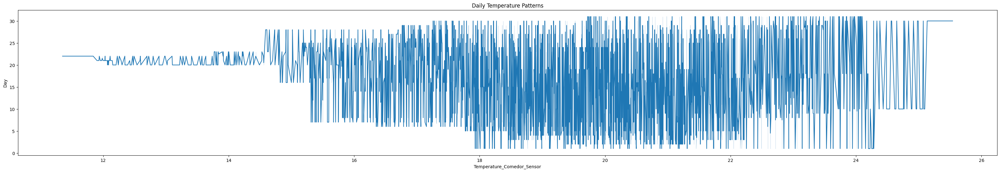

In [32]:
# Daily patterns
df1['Day'] = df1['Date'].dt.day
plt.figure(figsize=(40, 6))
sns.lineplot(x='Temperature_Comedor_Sensor', y='Day', data=df1)
plt.title('Daily Temperature Patterns')
plt.show()

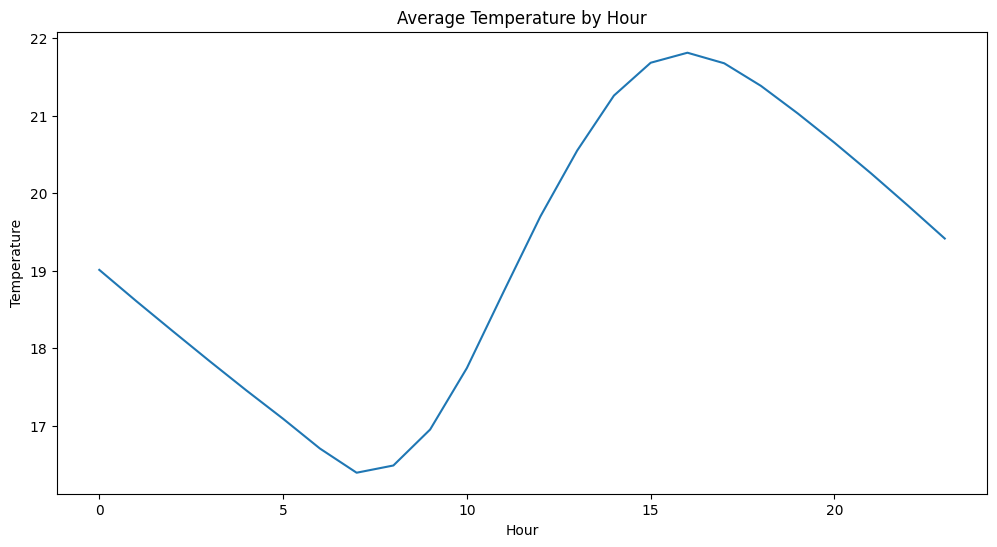

In [33]:
avg_temp_by_hour = df1.groupby('Hour')['Temperature_Comedor_Sensor'].mean()
plt.figure(figsize=(12, 6))
sns.lineplot(x=avg_temp_by_hour.index, y=avg_temp_by_hour.values)
y="Temperature_Comedor_Sensor"
plt.title('Average Temperature by Hour')
plt.xlabel('Hour')
plt.ylabel('Temperature')
plt.show()

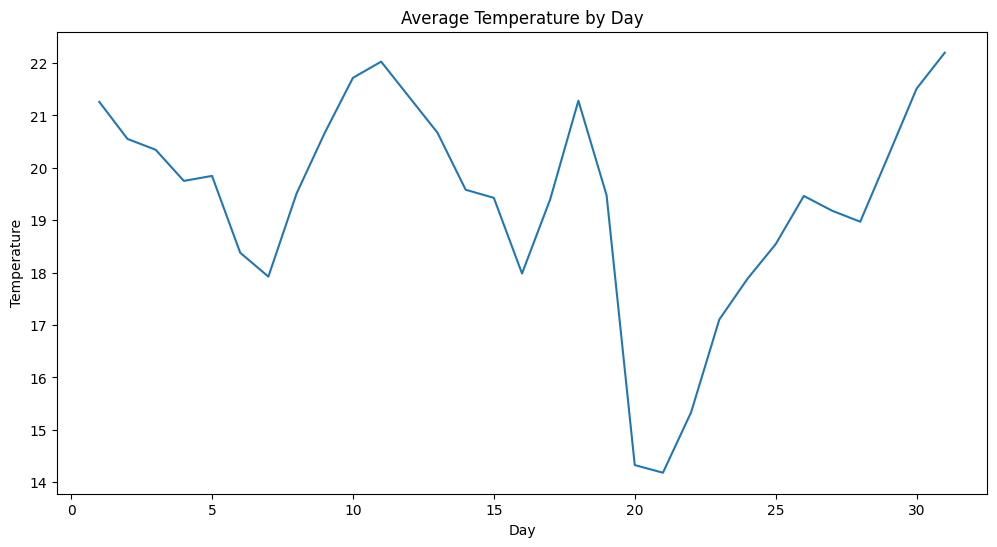

In [34]:
avg_temp_by_day = df1.groupby('Day')['Temperature_Comedor_Sensor'].mean()
plt.figure(figsize=(12, 6))
sns.lineplot(x=avg_temp_by_day.index, y=avg_temp_by_day.values)
y="Temperature_Comedor_Sensor"
plt.title('Average Temperature by Day')
plt.xlabel('Day')
plt.ylabel('Temperature')
plt.show()

ARIMA Model Summary:
                                   SARIMAX Results                                    
Dep. Variable:     Temperature_Comedor_Sensor   No. Observations:                 2764
Model:                         ARIMA(5, 1, 0)   Log Likelihood                5419.020
Date:                        Fri, 16 May 2025   AIC                         -10826.041
Time:                                22:43:19   BIC                         -10790.496
Sample:                            03-13-2012   HQIC                        -10813.202
                                 - 04-11-2012                                         
Covariance Type:                          opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          0.9923      0.006    156.343      0.000       0.980       1.005
ar.L2         -0.0014      0.008     -0.167   

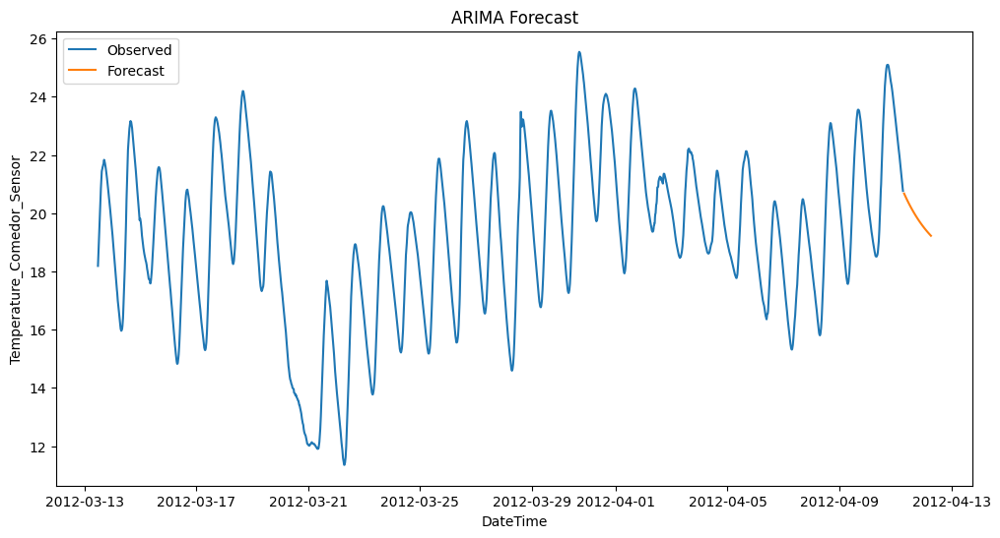

In [35]:
# Additional imports for time series forecasting
import statsmodels.api as sm
import warnings
warnings.simplefilter(action='ignore', category=FutureWarning)
import pandas as pd

# Prepare time series data for statsmodels and darts
df1['DateTime'] = pd.to_datetime(df1['Date'].dt.strftime('%Y-%m-%d') + ' ' + df1['Time'].dt.strftime('%H:%M:%S'))
df1 = df1.sort_values('DateTime')

ts_data = df1.set_index('DateTime')['Temperature_Comedor_Sensor'].astype(float)
ts_data = ts_data.interpolate(method='time')
ts_data = ts_data.asfreq('15T')  # Set explicit frequency to 15 minutes


# Statsmodels ARIMA model
arima_order = (5,1,0)  # example order, can be tuned
arima_model = sm.tsa.ARIMA(ts_data, order=arima_order)
arima_result = arima_model.fit()

# Forecast next 24 periods (assuming hourly data)
forecast_steps = 24
arima_forecast = arima_result.forecast(steps=forecast_steps)

print("ARIMA Model Summary:")
print(arima_result.summary())

# Plot ARIMA forecast
import matplotlib.pyplot as plt

plt.figure(figsize=(12,6))
plt.plot(ts_data.index, ts_data, label='Observed')
plt.plot(pd.date_range(ts_data.index[-1], periods=forecast_steps+1, freq='h')[1:], arima_forecast, label='Forecast')

plt.title('ARIMA Forecast')
plt.xlabel('DateTime')
plt.ylabel('Temperature_Comedor_Sensor')
plt.legend()
plt.show()


Tuning ARIMA hyperparameters...


e:\sml2010\cwvenv\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'
e:\sml2010\cwvenv\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'
e:\sml2010\cwvenv\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'
e:\sml2010\cwvenv\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
e:\sml2010\cwvenv\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:9

Best ARIMA order: (2, 0, 0), AIC: -7976.89
MAE: 1.94
MSE: 5.88


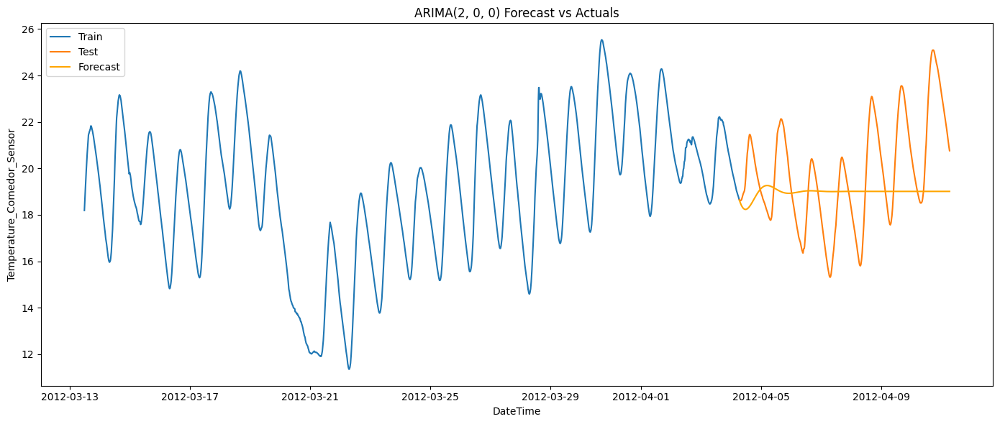

In [36]:
# Imports
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import statsmodels.api as sm
from sklearn.metrics import mean_squared_error, mean_absolute_error
import itertools
import warnings
warnings.simplefilter(action='ignore', category=FutureWarning)

# Prepare time series data
df1['DateTime'] = pd.to_datetime(df1['Date'].dt.strftime('%Y-%m-%d') + ' ' + df1['Time'].dt.strftime('%H:%M:%S'))
df1 = df1.sort_values('DateTime')

ts_data = df1.set_index('DateTime')['Temperature_Comedor_Sensor'].astype(float)
ts_data = ts_data.interpolate(method='time')
ts_data = ts_data.asfreq('15T')  # 15-minute interval

# Train-test split: use last 7 days as test
test_steps = 7 * 96  # 96 intervals per day (15 min)
train = ts_data[:-test_steps]
test = ts_data[-test_steps:]

# Grid Search for ARIMA(p,d,q)
p = d = q = range(0, 3)
pdq = list(itertools.product(p, d, q))

best_aic = float("inf")
best_order = None
best_model = None

print("Tuning ARIMA hyperparameters...")
for order in pdq:
    try:
        model = sm.tsa.ARIMA(train, order=order)
        result = model.fit()
        if result.aic < best_aic:
            best_aic = result.aic
            best_order = order
            best_model = result
    except:
        continue

print(f"Best ARIMA order: {best_order}, AIC: {best_aic:.2f}")

# Forecast
forecast = best_model.forecast(steps=len(test))

# Evaluation
mae = mean_absolute_error(test, forecast)
mse = mean_squared_error(test, forecast)

print(f"MAE: {mae:.2f}")
print(f"MSE: {mse:.2f}")

# Plot results
plt.figure(figsize=(14,6))
plt.plot(train.index, train, label='Train')
plt.plot(test.index, test, label='Test')
plt.plot(test.index, forecast, label='Forecast', color='orange')
plt.title(f'ARIMA{best_order} Forecast vs Actuals')
plt.xlabel('DateTime')
plt.ylabel('Temperature_Comedor_Sensor')
plt.legend()
plt.tight_layout()
plt.show()


#  Time-Based Feature Engineering

This section creates and analyzes temporal features:

1. **Created Features**:
   - `DayOfMonth`: Day within month (1-31)
   - `WeekOfYear`: Week number (1-52)
   - `IsWeekend`: Binary flag for weekends
   - `TimeOfDay`: Categorical period of day

2. **Analysis**:
   - Temperature distribution by time of day
   - Weekly temperature patterns
   - Weekend vs weekday patterns

Time categorization helps identify:
- Daily patterns
- Weekly cycles
- Seasonal trends

# Feature Engineering and Time-Based Analysis

This section creates and analyzes time-based features:

1. **Time Features**
   - Hour of day: $h \in [0,23]$
   - Day of week: $d \in [0,6]$
   - Week of year: $w \in [1,52]$
   - Is weekend: $weekend = \begin{cases} 1 & \text{if day} \in \{5,6\} \\ 0 & \text{otherwise} \end{cases}$

2. **Time Categories**
   Time of day categorization:
   - Night: [00:00, 06:00)
   - Morning: [06:00, 12:00)
   - Afternoon: [12:00, 18:00)
   - Evening: [18:00, 24:00)

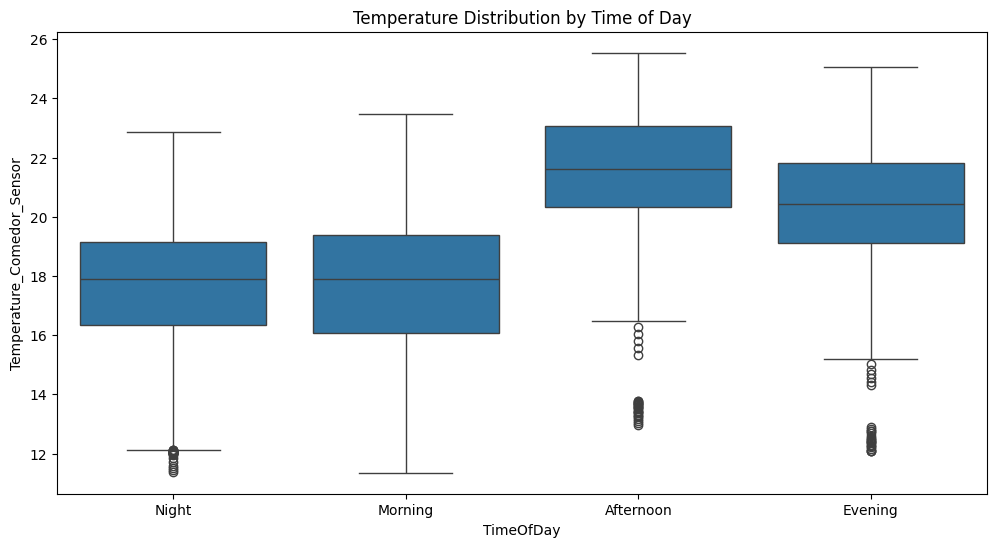

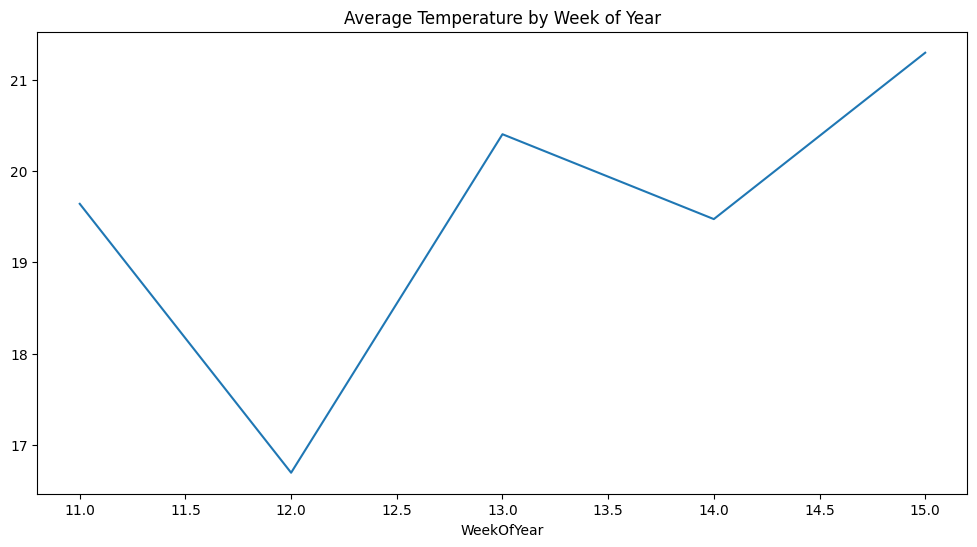

In [37]:
# Create more time-based features
df1['DayOfMonth'] = df1['Date'].dt.day
df1['WeekOfYear'] = df1['Date'].dt.isocalendar().week
df1['IsWeekend'] = df1['Date'].dt.dayofweek.isin([5,6]).astype(int)

# Time of day categories
df1['TimeOfDay'] = pd.cut(df1['Hour'], 
                         bins=[0, 6, 12, 18, 24], 
                         labels=['Night', 'Morning', 'Afternoon', 'Evening'])

# Analyze temperature patterns by time of day
plt.figure(figsize=(12, 6))
sns.boxplot(x='TimeOfDay', y='Temperature_Comedor_Sensor', data=df1)
plt.title('Temperature Distribution by Time of Day')
plt.show()

# Weekly patterns
plt.figure(figsize=(12, 6))
df1.groupby('WeekOfYear')['Temperature_Comedor_Sensor'].mean().plot()
plt.title('Average Temperature by Week of Year')
plt.show()

In [38]:
# First convert numeric columns to float (if not already done)
numeric_cols = ['Temperature_Comedor_Sensor', 'Temperature_Habitacion_Sensor', 
                'CO2_Comedor_Sensor', 'Humedad_Comedor_Sensor']

for col in numeric_cols:
    df1[col] = pd.to_numeric(df1[col], errors='coerce')  # coerce will turn invalid values to NaN

# Now create interaction features
df1['Temp_Ratio'] = df1['Temperature_Comedor_Sensor'] / df1['Temperature_Habitacion_Sensor']
df1['CO2_Humidity'] = df1['CO2_Comedor_Sensor'] * df1['Humedad_Comedor_Sensor']

# Time-based features
df1['Weekend'] = df1['Day_Of_Week'].isin([5, 6]).astype(int)
df1['Season'] = df1['Month'].apply(lambda x: (x%12 + 3)//3)  # 1=Winter, 2=Spring, etc.

# Check the new features
print(df1[['Temp_Ratio', 'CO2_Humidity', 'Weekend', 'Season']].head())

   Temp_Ratio  CO2_Humidity  Weekend  Season
0    1.020194   8643.451000        0       2
1    1.018907   8781.757885        0       2
2    1.017932   8726.096116        0       2
3    1.017140   8695.550688        0       2
4    1.017367   8659.726750        0       2


Day_Of_Week
2.00000    429
3.00000    406
4.00000    380
1.00000    380
6.00000    380
5.00000    380
7.00000    380
2.06667      5
4.06667      4
3.06667      4
6.06667      4
5.06667      4
6.60000      4
1.06667      4
Name: count, dtype: int64


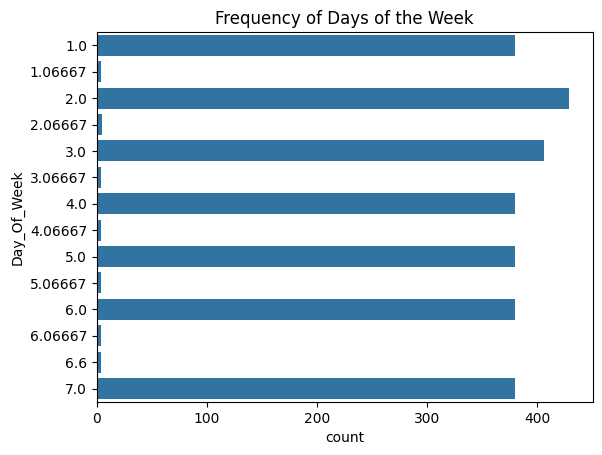

In [39]:
# Categorical Data Analysis
print(df1['Day_Of_Week'].value_counts())
sns.countplot(y='Day_Of_Week', data=df1 )
plt.title('Frequency of Days of the Week')
plt.show()

Day_Of_Week
1.00000    20.035636
1.06667    19.614825
2.00000    19.089801
2.06667    18.475600
3.00000    18.377144
3.06667    18.250525
4.00000    18.715573
4.06667    18.583150
5.00000    18.746681
5.06667    19.247675
6.00000    19.352329
6.06667    19.615325
6.60000    20.506350
7.00000    20.154353
Name: Temperature_Comedor_Sensor, dtype: float64


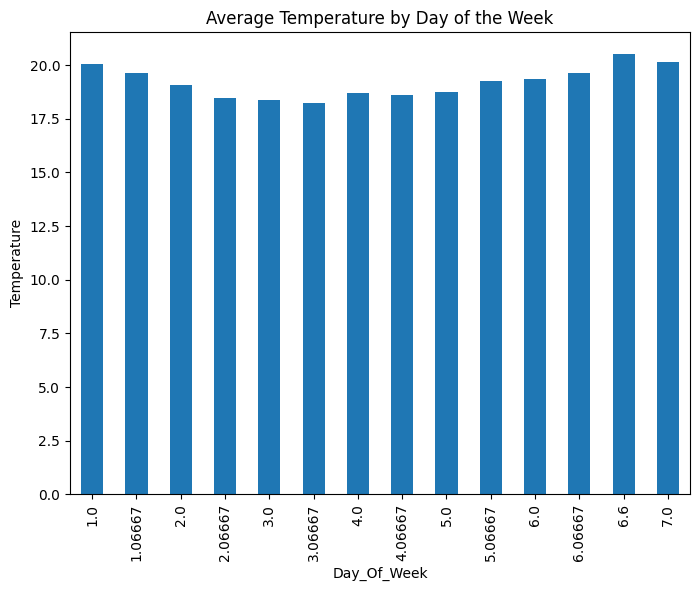

In [40]:
# Group-by Analysis
avg_temp_by_day = df1.groupby('Day_Of_Week')['Temperature_Comedor_Sensor'].mean()
print(avg_temp_by_day)
avg_temp_by_day.plot(kind='bar', figsize=(8, 6))
plt.title('Average Temperature by Day of the Week')
plt.ylabel('Temperature')
plt.show()

# Environmental Analysis

This section analyzes environmental conditions and their relationships:

1. **CO2 Analysis**:
   - Hourly patterns
   - Day-of-week variations
   - Correlation with temperature

2. **Humidity Analysis**:
   - Relationship with temperature
   - Daily patterns
   - Seasonal variations

3. **Temperature Patterns**:
   - Indoor vs outdoor comparisons
   - Daily fluctuations
   - Seasonal trends

Key insights:
- Occupancy patterns through CO2 levels
- Climate control effectiveness
- Building thermal behavior

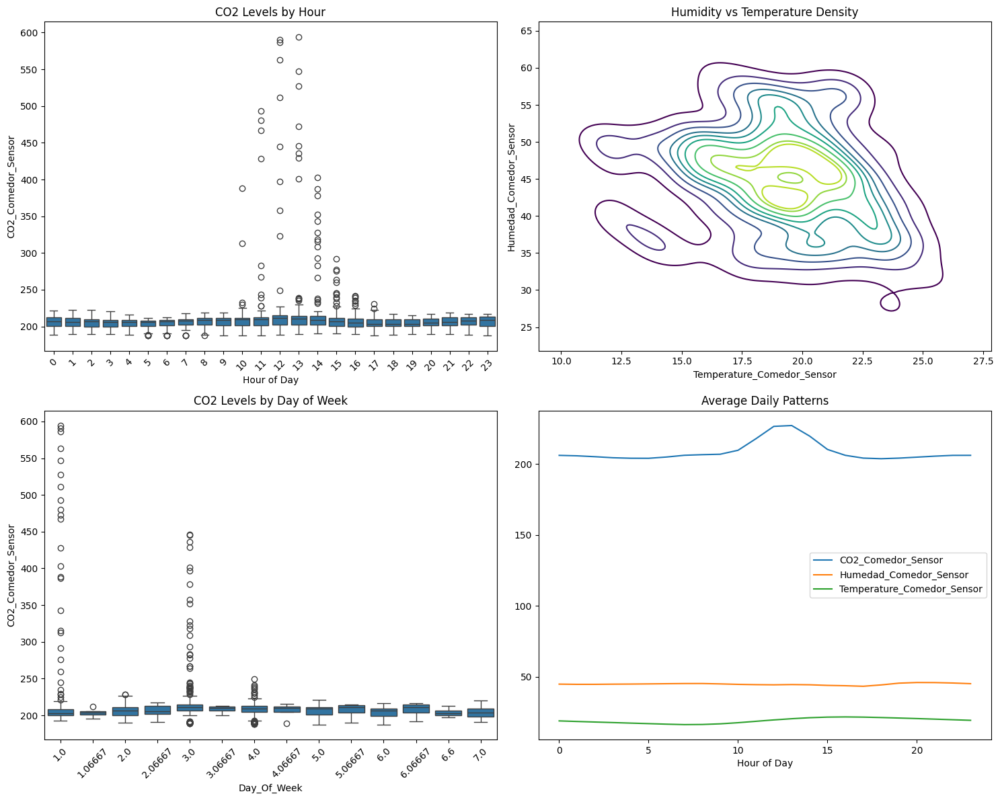

In [41]:
# Environmental Analysis

# Create figure with multiple subplots
fig, axes = plt.subplots(2, 2, figsize=(15, 12))

# CO2 levels by hour
sns.boxplot(x='Hour', y='CO2_Comedor_Sensor', data=df1, ax=axes[0,0])
axes[0,0].set_title('CO2 Levels by Hour')
axes[0,0].set_xlabel('Hour of Day')
axes[0,0].tick_params(axis='x', rotation=45)

# Humidity vs Temperature scatter plot with density
sns.kdeplot(data=df1, x='Temperature_Comedor_Sensor', y='Humedad_Comedor_Sensor', 
            ax=axes[0,1], cmap='viridis')
axes[0,1].set_title('Humidity vs Temperature Density')

# CO2 levels by day of week
sns.boxplot(x='Day_Of_Week', y='CO2_Comedor_Sensor', data=df1, ax=axes[1,0])
axes[1,0].set_title('CO2 Levels by Day of Week')
axes[1,0].tick_params(axis='x', rotation=45)

# Average daily patterns
daily_patterns = df1.groupby('Hour').agg({
    'CO2_Comedor_Sensor': 'mean',
    'Humedad_Comedor_Sensor': 'mean',
    'Temperature_Comedor_Sensor': 'mean'
}).plot(ax=axes[1,1])
axes[1,1].set_title('Average Daily Patterns')
axes[1,1].set_xlabel('Hour of Day')

plt.tight_layout()
plt.show()

# Advanced Time Series Analysis
In this section, we'll perform wavelet analysis and lag analysis to understand the temporal patterns in our data.

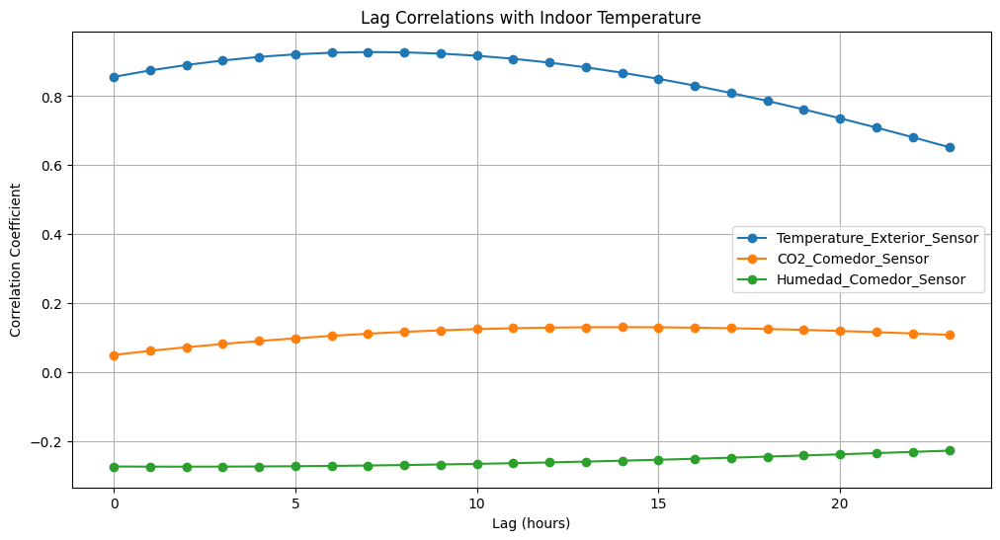


Optimal lag for Temperature_Exterior_Sensor: 7 hours
Maximum correlation: 0.928

Optimal lag for CO2_Comedor_Sensor: 14 hours
Maximum correlation: 0.131

Optimal lag for Humedad_Comedor_Sensor: 2 hours
Maximum correlation: -0.274


In [42]:
# Lag Analysis

# Calculate lagged correlations
max_lag = 24  # 24 hours
lag_corr = pd.DataFrame()

# Features to analyze
lag_features = ['Temperature_Exterior_Sensor', 'CO2_Comedor_Sensor', 'Humedad_Comedor_Sensor']

for feature in lag_features:
    correlations = [df1['Temperature_Comedor_Sensor'].corr(
        df1[feature].shift(lag)) for lag in range(max_lag)]
    lag_corr[feature] = correlations

# Plot lag correlations
plt.figure(figsize=(12, 6))
for feature in lag_features:
    plt.plot(range(max_lag), lag_corr[feature], label=feature, marker='o')
plt.title('Lag Correlations with Indoor Temperature')
plt.xlabel('Lag (hours)')
plt.ylabel('Correlation Coefficient')
plt.legend()
plt.grid(True)
plt.show()

# Find optimal lags
for feature in lag_features:
    optimal_lag = lag_corr[feature].abs().argmax()
    print(f"\nOptimal lag for {feature}: {optimal_lag} hours")
    print(f"Maximum correlation: {lag_corr[feature].iloc[optimal_lag]:.3f}")

# Seasonal Pattern Analysis

This section examines seasonal variations in the data:

1. **Season Definition**:
   - Winter: December-February
   - Spring: March-May
   - Summer: June-August
   - Fall: September-November

2. **Analysis Components**:
   - Temperature variations by season
   - Seasonal CO2 patterns
   - Indoor-outdoor temperature differences
   - Seasonal energy usage patterns

3. **Key Metrics**:
   - Mean seasonal temperatures
   - Seasonal variation coefficients
   - Inter-seasonal changes

In [43]:
# Define seasons
def get_season(month):
    if month in [12, 1, 2]:
        return 'Winter'
    elif month in [3, 4, 5]:
        return 'Spring'
    elif month in [6, 7, 8]:
        return 'Summer'
    else:
        return 'Fall'

# Add season column
df1['Season'] = df1['Month'].apply(get_season)

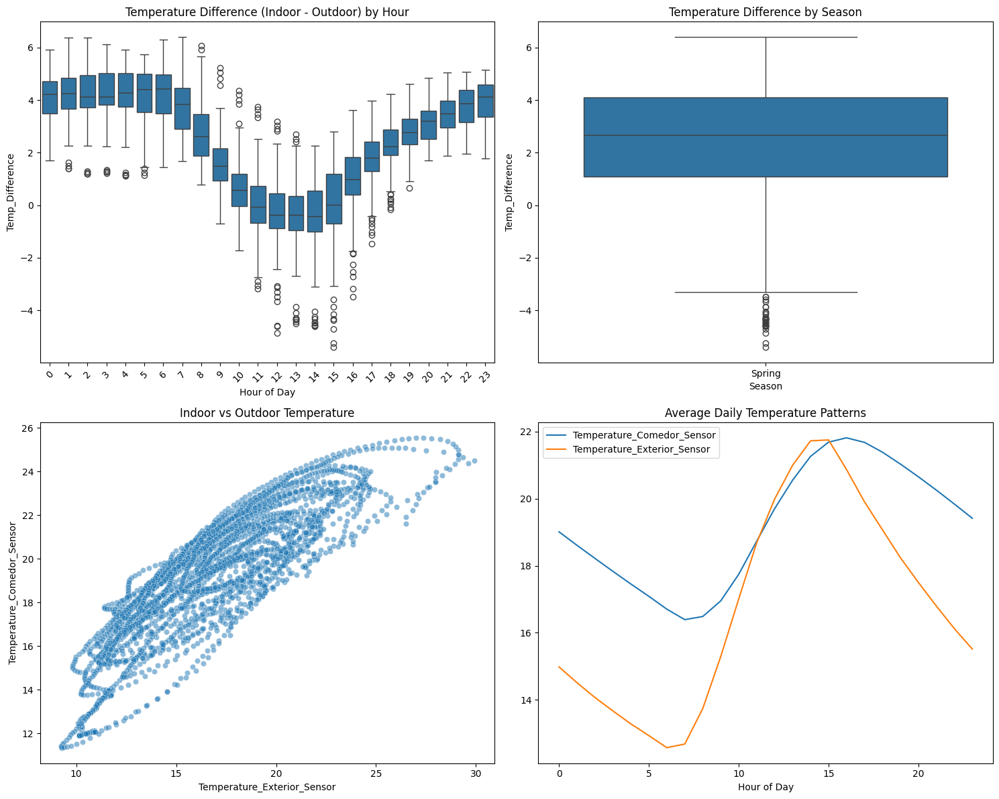


Correlation between indoor and outdoor temperature: 0.86

Average temperature difference by season:
Season
Spring    2.441875
Name: Temp_Difference, dtype: float64


In [44]:
# Weather Impact Analysis

# Calculate temperature differences
df1['Temp_Difference'] = df1['Temperature_Comedor_Sensor'] - df1['Temperature_Exterior_Sensor']

# Create subplots for weather impact analysis
fig, axes = plt.subplots(2, 2, figsize=(15, 12))

# Temperature difference by hour
sns.boxplot(x='Hour', y='Temp_Difference', data=df1, ax=axes[0, 0])
axes[0, 0].set_title('Temperature Difference (Indoor - Outdoor) by Hour')
axes[0, 0].set_xlabel('Hour of Day')
axes[0, 0].tick_params(axis='x', rotation=45)

# Temperature difference by season
sns.boxplot(x='Season', y='Temp_Difference', data=df1, ax=axes[0, 1])
axes[0, 1].set_title('Temperature Difference by Season')

# Scatter plot of indoor vs outdoor temperature
sns.scatterplot(data=df1, x='Temperature_Exterior_Sensor', 
                y='Temperature_Comedor_Sensor', alpha=0.5,
                ax=axes[1, 0])
axes[1, 0].set_title('Indoor vs Outdoor Temperature')

# Daily temperature patterns
daily_temps = df1.groupby('Hour').agg({
    'Temperature_Comedor_Sensor': 'mean',
    'Temperature_Exterior_Sensor': 'mean'
}).plot(ax=axes[1, 1])
axes[1, 1].set_title('Average Daily Temperature Patterns')
axes[1, 1].set_xlabel('Hour of Day')

plt.tight_layout()
plt.show()

# Calculate correlation between indoor and outdoor temperature
corr = df1['Temperature_Comedor_Sensor'].corr(df1['Temperature_Exterior_Sensor'])
print(f"\nCorrelation between indoor and outdoor temperature: {corr:.2f}")

# Calculate average temperature difference by season
season_diff = df1.groupby('Season')['Temp_Difference'].mean().sort_values(ascending=False)
print("\nAverage temperature difference by season:")
print(season_diff)

Season
Spring    19.199722
Name: Temperature_Comedor_Sensor, dtype: float64


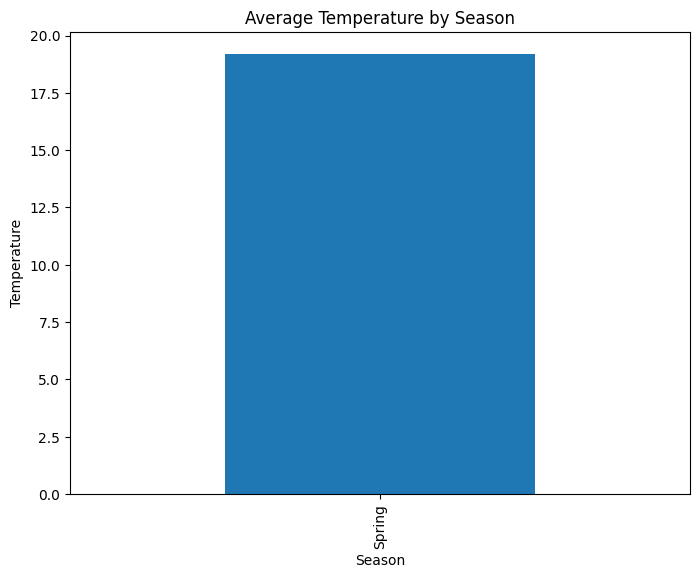

In [45]:
# Seasonal Analysis
def get_season(month):
    if month in [12, 1, 2]:
        return 'Winter'
    elif month in [3, 4, 5]:
        return 'Spring'
    elif month in [6, 7, 8]:
        return 'Summer'
    else:
        return 'Fall'

df1['Season'] = df1['Month'].apply(get_season)
avg_temp_by_season = df1.groupby('Season')['Temperature_Comedor_Sensor'].mean()
print(avg_temp_by_season)
avg_temp_by_season.plot(kind='bar', figsize=(8, 6))
plt.title('Average Temperature by Season')
plt.ylabel('Temperature')
plt.show()

Anomalies:
          Date                Time  Temperature_Comedor_Sensor  \
721 2012-03-21 1900-01-01 00:00:00                     12.0427   
722 2012-03-21 1900-01-01 00:15:00                     12.0387   
723 2012-03-21 1900-01-01 00:30:00                     12.0287   
724 2012-03-21 1900-01-01 00:45:00                     12.0240   
725 2012-03-21 1900-01-01 01:00:00                     12.0120   
726 2012-03-21 1900-01-01 01:15:00                     12.0200   
727 2012-03-21 1900-01-01 01:30:00                     12.0280   
728 2012-03-21 1900-01-01 01:45:00                     12.0567   
729 2012-03-21 1900-01-01 02:00:00                     12.0667   
743 2012-03-21 1900-01-01 05:30:00                     12.0567   
744 2012-03-21 1900-01-01 05:45:00                     12.0353   
745 2012-03-21 1900-01-01 06:00:00                     12.0320   
746 2012-03-21 1900-01-01 06:15:00                     12.0240   
747 2012-03-21 1900-01-01 06:30:00                     12.0000   

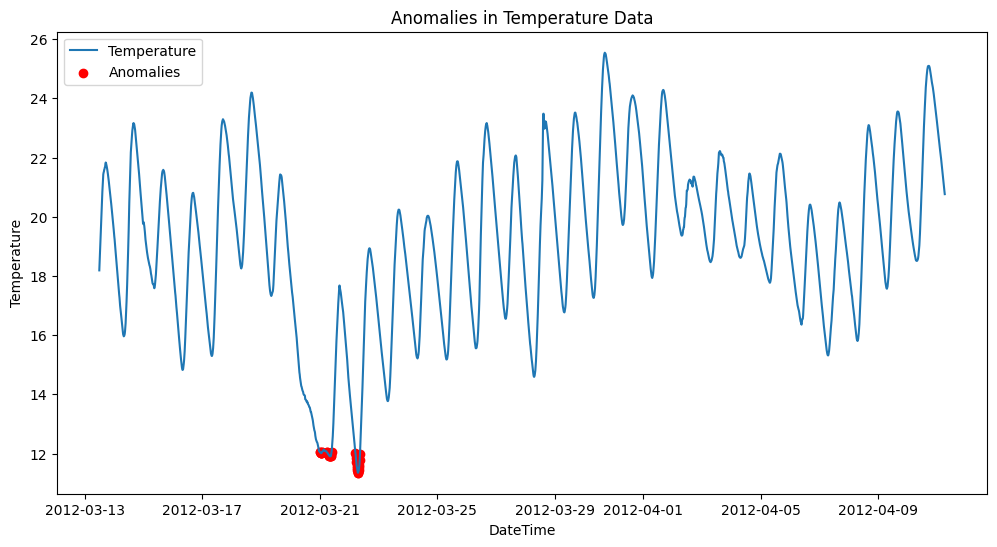

In [46]:
# Anomaly Detection
df1['Temperature_Zscore'] = zscore(df1['Temperature_Comedor_Sensor'])
anomalies = df1[(df1['Temperature_Zscore'] > 2.5) | (df1['Temperature_Zscore'] < -2.5)]
print('Anomalies:')
print(anomalies)
# Plot anomalies
plt.figure(figsize=(12, 6))
plt.plot(df1['DateTime'], df1['Temperature_Comedor_Sensor'], label='Temperature')
plt.scatter(anomalies['DateTime'], anomalies['Temperature_Comedor_Sensor'], color='red', label='Anomalies')
plt.title('Anomalies in Temperature Data')
plt.xlabel('DateTime')  
plt.ylabel('Temperature')
plt.legend()
plt.show()


In [47]:
# This will give you stats like min, max, mean for the Z-scores
print("Z-score statistics:")
print(df1['Temperature_Zscore'].describe())

# You can also see the highest and lowest Z-scores
print("\nTop 5 highest Z-scores:")
print(df1['Temperature_Zscore'].nlargest(5))
print("\nTop 5 lowest Z-scores:")
print(df1['Temperature_Zscore'].nsmallest(5))


Z-score statistics:
count    2.764000e+03
mean    -5.141409e-16
std      1.000181e+00
min     -2.750886e+00
25%     -6.130549e-01
50%      6.096748e-02
75%      7.116706e-01
max      2.222477e+00
Name: Temperature_Zscore, dtype: float64

Top 5 highest Z-scores:
1652    2.222477
1653    2.218270
1651    2.213608
1654    2.212206
1655    2.203793
Name: Temperature_Zscore, dtype: float64

Top 5 lowest Z-scores:
845   -2.750886
846   -2.749729
844   -2.738722
847   -2.737565
848   -2.722387
Name: Temperature_Zscore, dtype: float64


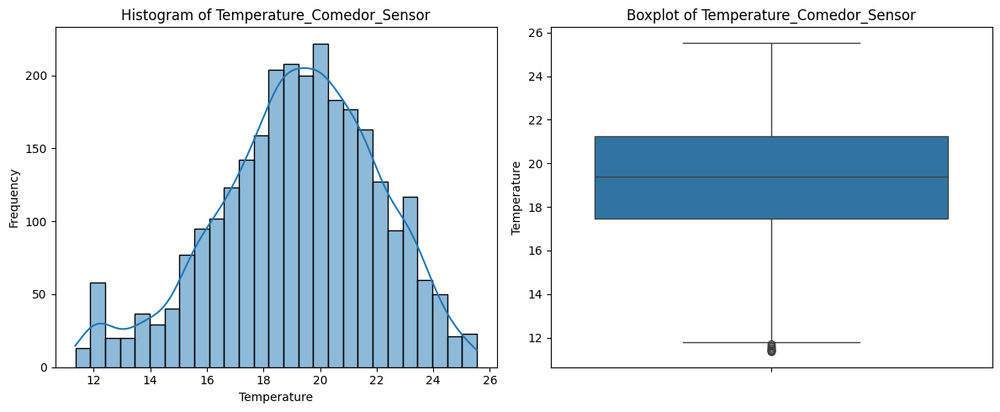

In [48]:
import matplotlib.pyplot as plt
import seaborn as sns

plt.figure(figsize=(12, 5))

plt.subplot(1, 2, 1)
sns.histplot(df1['Temperature_Comedor_Sensor'], kde=True)
plt.title('Histogram of Temperature_Comedor_Sensor')
plt.xlabel('Temperature')
plt.ylabel('Frequency')

plt.subplot(1, 2, 2)
sns.boxplot(y=df1['Temperature_Comedor_Sensor'])
plt.title('Boxplot of Temperature_Comedor_Sensor')
plt.ylabel('Temperature')

plt.tight_layout()
plt.show()


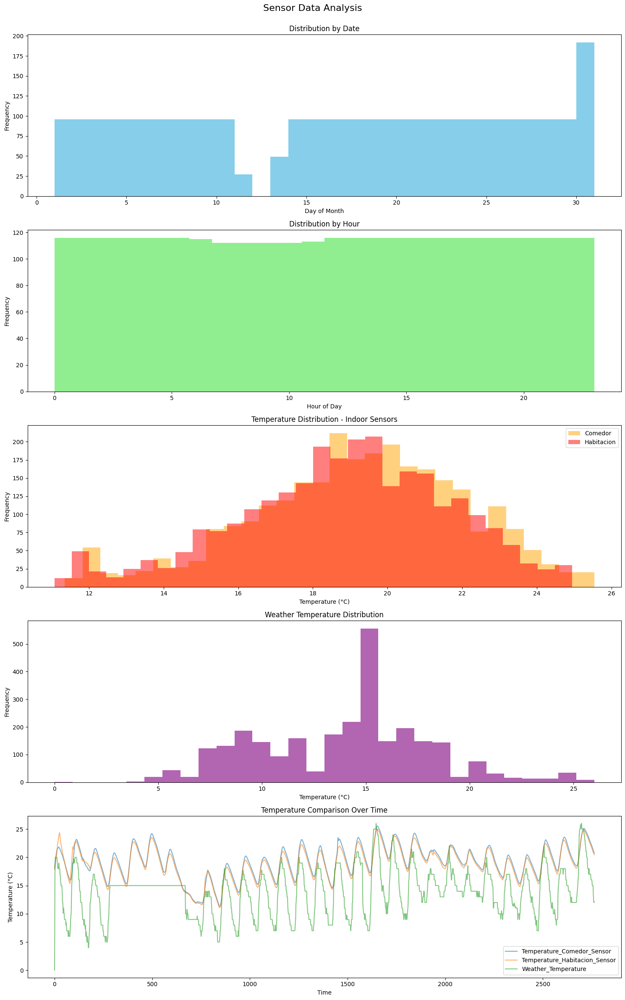

In [49]:
# Create a figure with subplots
fig, axs = plt.subplots(5, 1, figsize=(15, 25))
fig.suptitle('Sensor Data Analysis', fontsize=16, y=0.95)

# Plot 1: Date Distribution
axs[0].hist(df1['Date'].dt.day, bins=30, color='skyblue')
axs[0].set_title('Distribution by Date')
axs[0].set_xlabel('Day of Month')
axs[0].set_ylabel('Frequency')

# Plot 2: Time Distribution
axs[1].hist(df1['Hour'], bins=24, color='lightgreen')
axs[1].set_title('Distribution by Hour')
axs[1].set_xlabel('Hour of Day')
axs[1].set_ylabel('Frequency')

# Plot 3: Temperature Distributions
axs[2].hist(df1['Temperature_Comedor_Sensor'], bins=30, alpha=0.5, label='Comedor', color='orange')
axs[2].hist(df1['Temperature_Habitacion_Sensor'], bins=30, alpha=0.5, label='Habitacion', color='red')
axs[2].set_title('Temperature Distribution - Indoor Sensors')
axs[2].set_xlabel('Temperature (°C)')
axs[2].set_ylabel('Frequency')
axs[2].legend()

# Plot 4: Weather Temperature
axs[3].hist(df1['Weather_Temperature'], bins=30, color='purple', alpha=0.6)
axs[3].set_title('Weather Temperature Distribution')
axs[3].set_xlabel('Temperature (°C)')
axs[3].set_ylabel('Frequency')

# Plot 5: Temperature Comparison
df1.plot(y=['Temperature_Comedor_Sensor', 'Temperature_Habitacion_Sensor', 'Weather_Temperature'],
        ax=axs[4], alpha=0.6)
axs[4].set_title('Temperature Comparison Over Time')
axs[4].set_xlabel('Time')
axs[4].set_ylabel('Temperature (°C)')

# Adjust layout to prevent overlap
plt.tight_layout( rect=[0, 0, 1, 0.95])  # Leave space for the main title
plt.show()

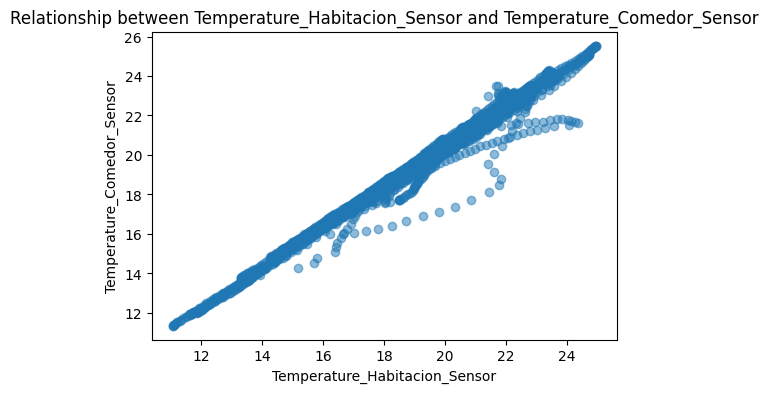

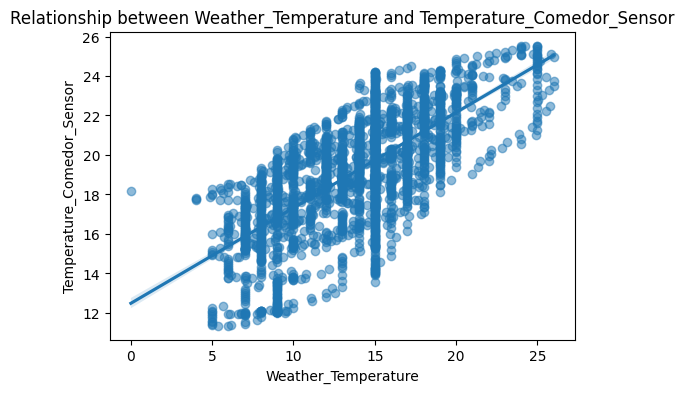

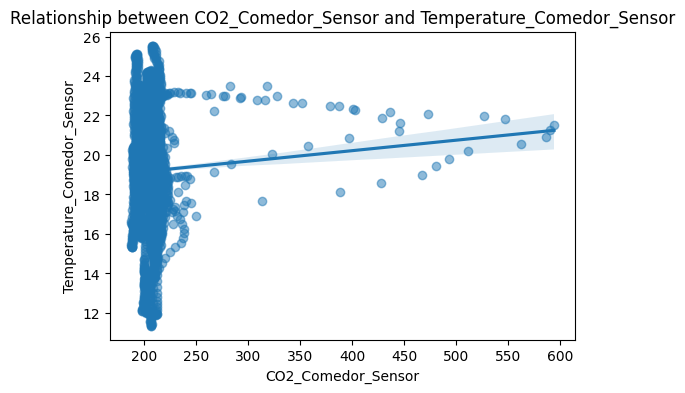

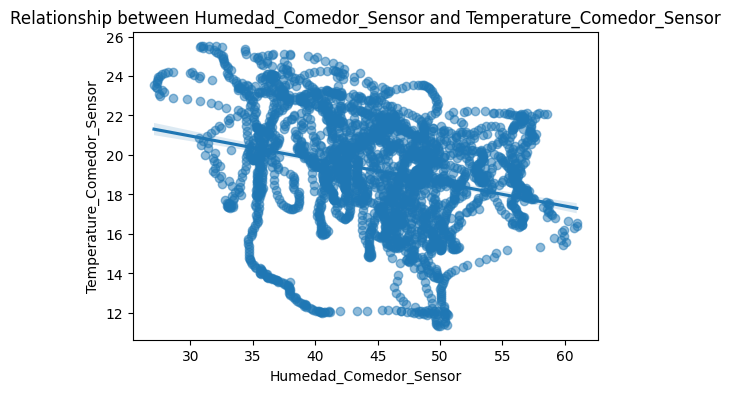

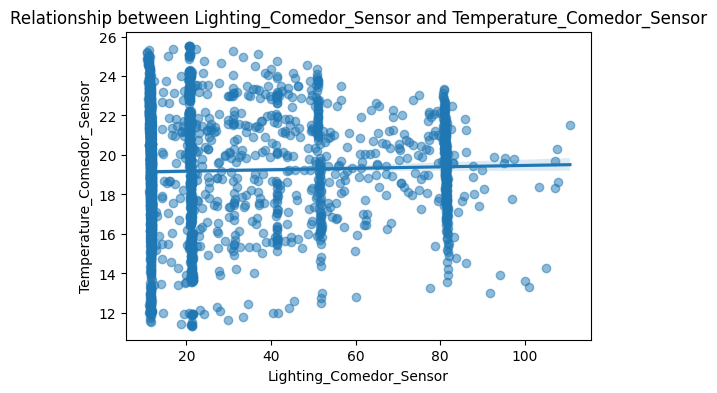

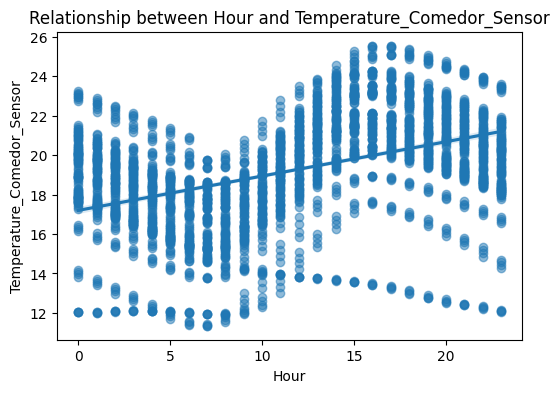

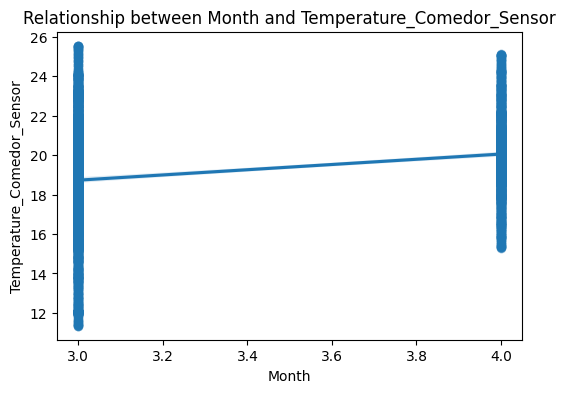

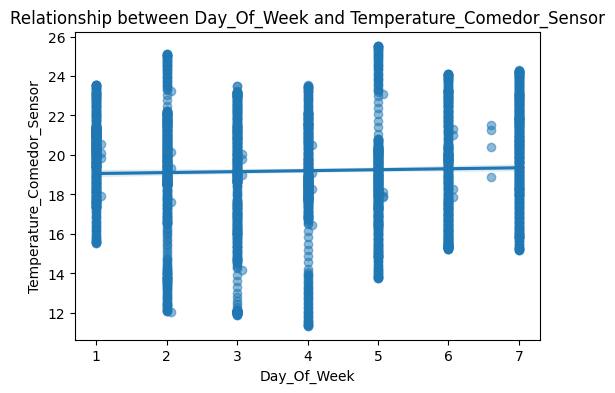

In [50]:
import matplotlib.pyplot as plt
import seaborn as sns

features = ['Temperature_Habitacion_Sensor', 'Weather_Temperature', 'CO2_Comedor_Sensor', 'Humedad_Comedor_Sensor', 'Lighting_Comedor_Sensor', 'Hour', 'Month', 'Day_Of_Week']
target = 'Temperature_Comedor_Sensor'

for feature in features:
    plt.figure(figsize=(6,4))
    sns.regplot(x=df1[feature], y=df1[target], scatter_kws={'alpha':0.5})
    plt.title(f'Relationship between {feature} and {target}')
    plt.show()


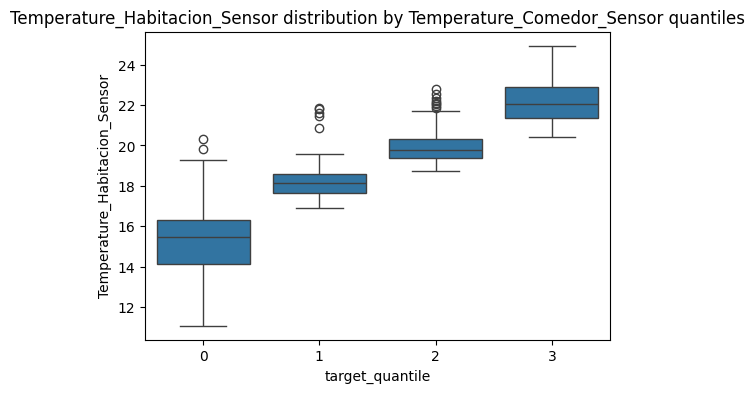

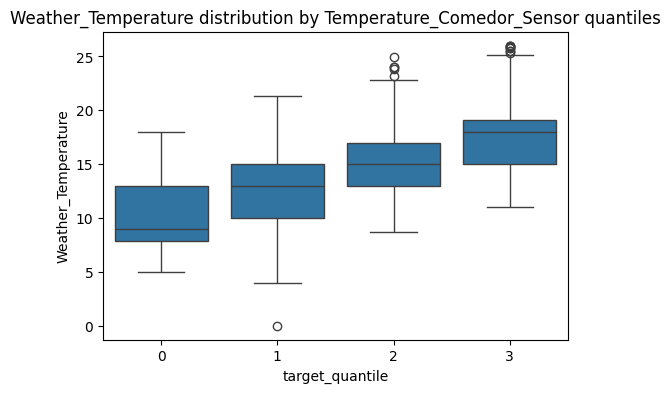

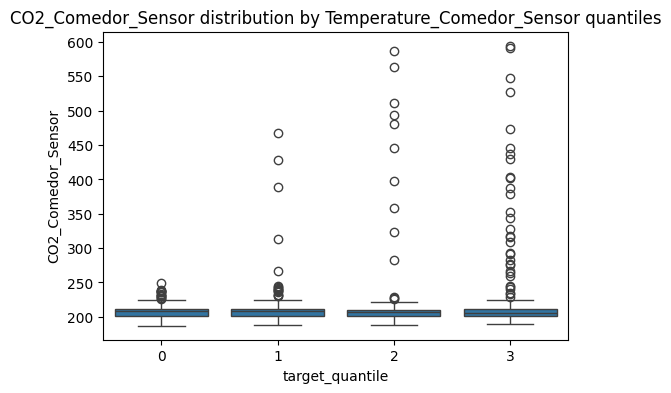

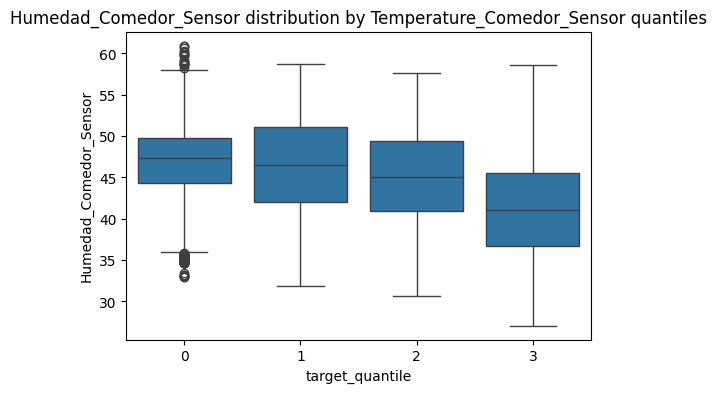

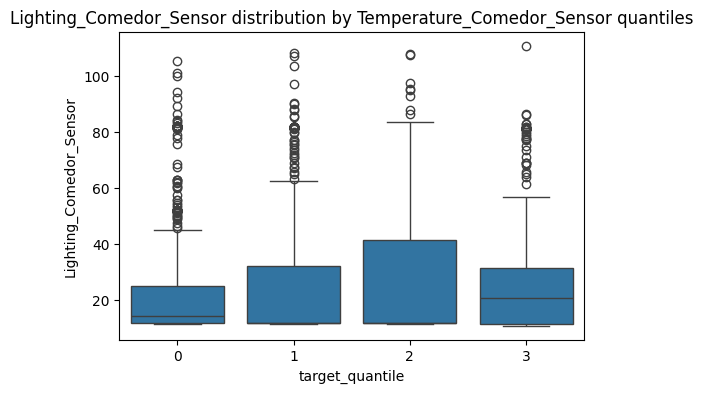

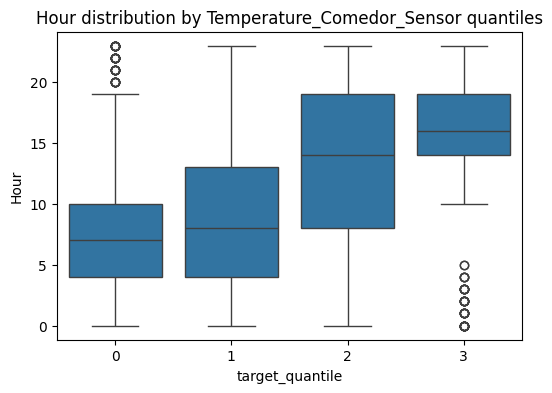

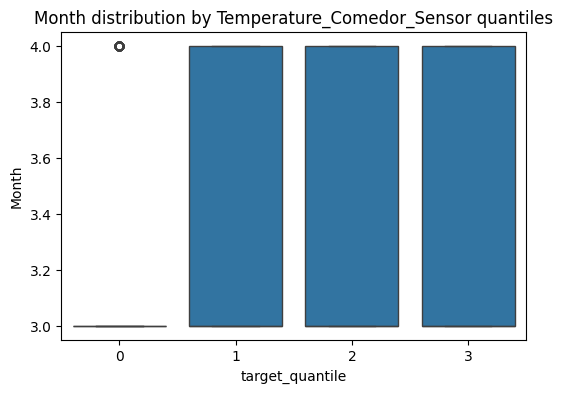

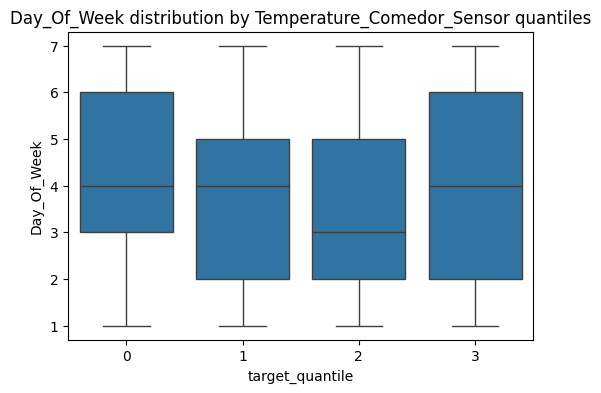

In [51]:
df1['target_quantile'] = pd.qcut(df1[target], q=4, labels=False)

for feature in features:
    plt.figure(figsize=(6,4))
    sns.boxplot(x='target_quantile', y=feature, data=df1)
    plt.title(f'{feature} distribution by {target} quantiles')
    plt.show()


In [52]:
from statsmodels.stats.outliers_influence import variance_inflation_factor
import pandas as pd

X = df1[features].select_dtypes(include=[float, int]).dropna()
vif_data = pd.DataFrame()
vif_data['feature'] = X.columns
vif_data['VIF'] = [variance_inflation_factor(X.values, i) for i in range(len(X.columns))]
print(vif_data)


                         feature         VIF
0  Temperature_Habitacion_Sensor  106.065070
1            Weather_Temperature   36.960427
2             CO2_Comedor_Sensor   49.436877
3         Humedad_Comedor_Sensor   51.972333
4        Lighting_Comedor_Sensor    3.594892
5                           Hour    5.149620
6                          Month   63.008730
7                    Day_Of_Week    4.860632


In [53]:
# import statsmodels.api as sm

# X = sm.add_constant(X)
# model = sm.OLS(y, X).fit()
# influence = model.get_influence()
# (c, p) = influence.cooks_distance

# plt.figure(figsize=(8,4))
# plt.stem(np.arange(len(c)), c, markerfmt=",")
# plt.title("Cook's distance for each observation")
# plt.xlabel('Observation index')
# plt.ylabel("Cook's distance")
# plt.show()


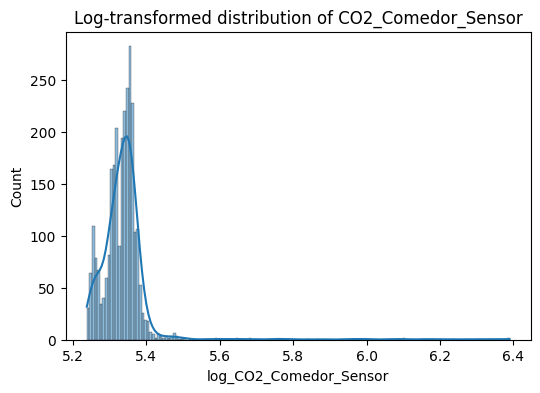

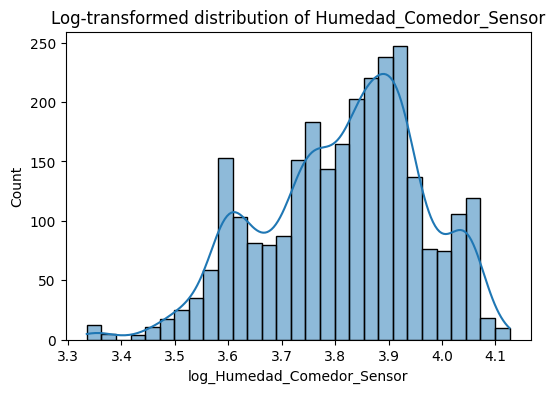

In [54]:
import numpy as np

skewed_features = ['CO2_Comedor_Sensor', 'Humedad_Comedor_Sensor']
for feature in skewed_features:
    df1[f'log_{feature}'] = np.log1p(df1[feature])
    plt.figure(figsize=(6,4))
    sns.histplot(df1[f'log_{feature}'].dropna(), kde=True)
    plt.title(f'Log-transformed distribution of {feature}')
    plt.show()


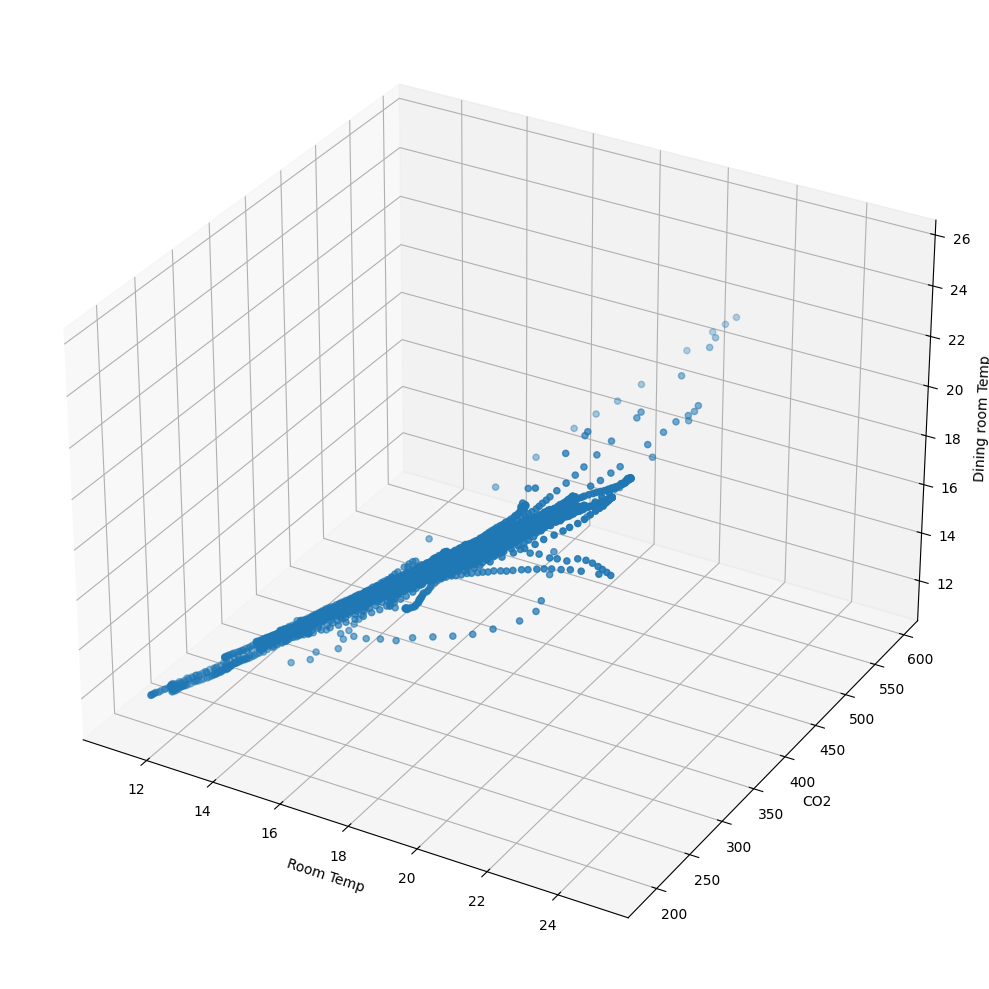

In [61]:
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D  # noqa: F401

fig = plt.figure(figsize=(10, 10))
ax = fig.add_subplot(111, projection='3d')

ax.scatter(df1['Temperature_Habitacion_Sensor'], 
           df1['CO2_Comedor_Sensor'], 
           df1['Temperature_Comedor_Sensor'])

ax.set_xlabel('Room Temp')
ax.set_ylabel('CO2')
ax.set_zlabel('Dining room Temp')

# Adjust layout to prevent label cutoff
fig.tight_layout()

plt.show()



e:\sml2010\cwvenv\Lib\site-packages\keras\src\layers\rnn\rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Model: "sequential_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ gru_1 (GRU)                     │ (None, 50)             │        11,550 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 1)              │            51 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 11,601 (45.32 KB)

 Trainable params: 11,601 (45.32 KB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/50
56/56 ━━━━━━━━━━━━━━━━━━━━ 3s 15ms/step - loss: 0.0478 - val_loss: 0.0162
Epoch 2/50
56/56 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - loss: 0.0015 - val_loss: 0.0095
Epoch 3/50
56/56 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 9.3040e-04 - val_loss: 0.0079
Epoch 4/50
56/56 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 7.1386e-04 - val_loss: 0.0039
Epoch 5/50
56/56 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 4.7570e-04 - val_loss: 0.0031
Epoch 6/50
56/56 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 3.1368e-04 - val_loss: 0.0019
Epoch 7/50
56/56 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - loss: 2.6266e-04 - val_loss: 0.0012
Epoch 8/50
56/56 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 1.4377e-04 - val_loss: 5.0859e-04
Epoch 9/50
56/56 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 1.3330e-04 - val_loss: 4.6893e-04
Epoch 10/50
56/56 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 9.7125e-05 - val_loss: 2.8050e-04
Epoch 11/50
56/56 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 9.4608e-05 - val_loss: 2.8738e-04
Epoch 12/50
56/56 ━━━

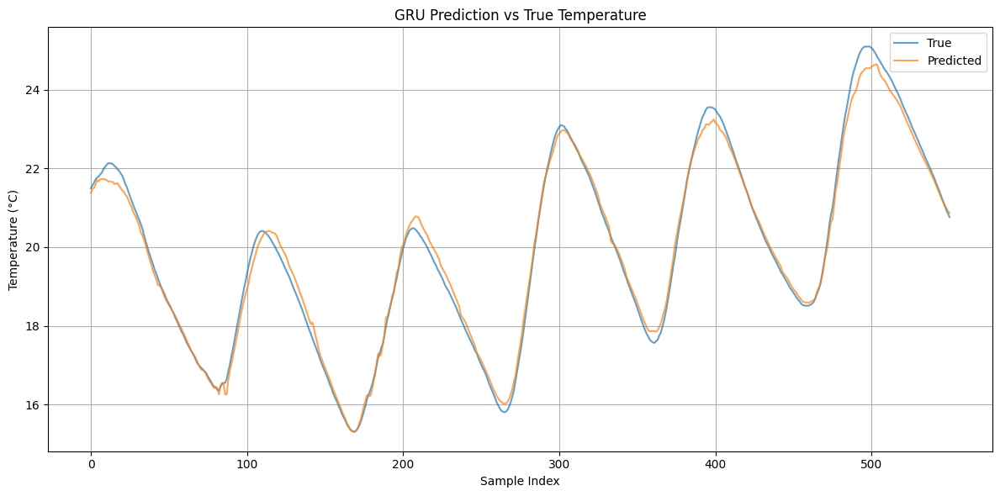

In [64]:
import numpy as np
import pandas as pd
from sklearn.preprocessing import MinMaxScaler
from sklearn.metrics import mean_squared_error
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import GRU, Dense
from tensorflow.keras.callbacks import EarlyStopping
import matplotlib.pyplot as plt

# 1. Load the data
data = df1.copy()

# 3. Select features and target
features = data.drop(columns=[
    'Date', 'Time', 'Temperature_Habitacion_Sensor', 'Weather_Temperature',
    'CO2_Comedor_Sensor', 'Humedad_Comedor_Sensor',
    'Lighting_Comedor_Sensor', 'Hour', 'Month', 'Day_Of_Week'
])
target = data['Temperature_Comedor_Sensor']

# Keep only numeric columns in features
features_numeric = features.select_dtypes(include=['number'])

# 4. Normalize
scaler_X = MinMaxScaler()
scaler_y = MinMaxScaler()

X_scaled = scaler_X.fit_transform(features_numeric)
y_scaled = scaler_y.fit_transform(target.values.reshape(-1, 1))

# 5. Create sequences for GRU (use past 10 time steps to predict next)
def create_sequences(X, y, time_steps=10):
    Xs, ys = [], []
    for i in range(len(X) - time_steps):
        Xs.append(X[i:(i + time_steps)])
        ys.append(y[i + time_steps])
    return np.array(Xs), np.array(ys)

time_steps = 10
X_seq, y_seq = create_sequences(X_scaled, y_scaled, time_steps)

# 6. Split into train and test sets (80% train)
split = int(0.8 * len(X_seq))
X_train, X_test = X_seq[:split], X_seq[split:]
y_train, y_test = y_seq[:split], y_seq[split:]

# 7. Build the GRU model
model = Sequential()
model.add(GRU(50, input_shape=(X_train.shape[1], X_train.shape[2])))
model.add(Dense(1))  # Predict one value (temperature)

model.compile(optimizer='adam', loss='mse')
model.summary()

# 8. Train the model
early_stop = EarlyStopping(monitor='val_loss', patience=5, restore_best_weights=True)

history = model.fit(
    X_train, y_train,
    epochs=50,
    batch_size=32,
    validation_split=0.2,
    callbacks=[early_stop],
    verbose=1
)

# 9. Evaluate
loss = model.evaluate(X_test, y_test)
print(f'Test Loss (MSE): {loss}')

# 10. Predict and invert scaling
y_pred = model.predict(X_test)
y_pred_rescaled = scaler_y.inverse_transform(y_pred)
y_test_rescaled = scaler_y.inverse_transform(y_test)

# 11. Calculate RMSE
mse = mean_squared_error(y_test_rescaled, y_pred_rescaled)
rmse = np.sqrt(mse)
print(f'Test RMSE: {rmse:.3f} °C')

# 12. Plot true vs predicted
plt.figure(figsize=(12, 6))
plt.plot(y_test_rescaled, label='True', alpha=0.7)
plt.plot(y_pred_rescaled, label='Predicted', alpha=0.7)
plt.title('GRU Prediction vs True Temperature')
plt.xlabel('Sample Index')
plt.ylabel('Temperature (°C)')
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()
